#### Предприятие выпускает высокопроницаемую трансформаторную сталь (ВПС)
* Основной показатель качества ВПС – низкие удельные магнитные потери
* ВПС считается качественной при удельных магнитных потерях < 1.1 Вт/кг
#### Цель работы: 
Определить возможные направления улучшения технологического процесса для увеличения процента выхода продукции с низкими удельными магнитными потерями
#### Задачи (и их важность):
* Определить проблемы с данными по параметрам технологического процесса (70%)
* Определить наиболее важные этапы и параметры технологического процесса, влияющие на качество продукции (30%)
#### "Удельные потери" - целевая переменная
#### Основные понятия
* Производство ВПС начинается с плавки
* Плавка разливается на заготовки (слябы)
* Из сляба производится горячекатаный рулон
* Горячекатаный рулон нормализуется и отправляется на холодный прокат
* Холоднокатаный рулон обезуглероживается

#### Важно:
* Одной плавке соответствует несколько рулонов (уточнить: 1 плавка - несколько слябов. 1 сляб - 1 рулон?)
* В процессе обработки рулоны могут разрезаться (из длинного получается несколько коротких)
* Каждый рулон имеет свою длину, толщину, ширину

#### Ожидаемые результаты:
Решение в Jupyter Notebook, включающее:  
1. Визуализацию обнаруженных проблем с исходными данными и способы их преодоления.  
2. Вопросы и комментарии к технологу / IT специалисту Заказчика.
3. Таблицу с ключевыми признаками, влияющими на качество продукции:
   * Этап процесса
   * Название признака
   * Важность признака 

| Этапы процесса | Стадии этапа "Обезуглероживание" |
| --- | --- |
| ![title](img/process.png) |  ![title](img/stages.png) |
 


### Результаты:

#### Проблемы с исходными данными и способы решения:

1. [Категоризируем целевую переменную](#100)
2. [Конвертируем столбцы с временем в формат datetime64](#200)
3. [Конвертируем значения столбцов 'T_Этап2_зона6' и 'Кислород_конец' во float](#200)
4. [Очищаем значения столбца 'Толщина_перед_смоткой' (в строке присутствуют цифры и буквы) + конвертируем во float](#200)
5. [Категорируем значения столбца 'ШОС' с помощью .get_dummies](#300)
6. [Категорируем значения переменных с небольшим количеством уникальных значений](#400)

Восстанавливаем пропуски в данных:

7. [Этап "Обезуглероживание" - восстанавливаем данные о времени обработки в технологической секции и непрерывного отжига  + добавляем поле с разницей по времени обработки в технологической секции / непрерывного отжига.](#500)
    - Отсуствует часть данных о времени начала/окончания Поступление_в_технологическую_секцию
    - Отсуствует часть данных о времени начала/окончания технологического отжига
8.  [Этап 'Обезуглероживание' - интерполяцией и экстраполяцией восстанавливаем данные по "точке росы"](#600)
    - Перезаписываем данные столбца 'Точка_росы_Этап4_зона1'
9. [Этап 'Обезуглероживание' восстанавливаем данные по CO:](#700)
    - Данные 'CO_Этап1_зона1' - всего 1300 значений - выбрасываем
    - NAN данные 'CO_Этап1_зона2' заменяем медианой
11. [Убираем выбросы данных](#900)
    - Заменяем выбросы медианами 
    - Нулевые значения в столбце "T_Этап1_зона6" - восстанавливаем экстраполяцией столбцов "T_Этап1_зона 1...5"
    - Некорректные данные в столбце "T_Этап3_зона4" - исключаем из анализа
12. [Смотрим группировки данных](#1000)
    - Номера рулонов повторяются для разных плавок.
13. [Проверяем распределение целевой переменной между 2 столбцами](#1100)
14. [Анализ консистентности данных](#1150)

15. [Анализ коррелляци переменных](#1200)
    - внутри этапов
    - между этапами и целевой переменной

16. [Поиск ключевых признаков, влияющих на качество](#1300)

#### 17. [Итоговая таблица с ключевыми признаками, влияющих на качество](#1400)

18. [Обучаем модель и проверяем качество предсказания.](#1500)


#### Вопросы и комментарии к данным:
1. На этапе 'холодный прокат' Температура этапа 3 должна быть больше температуры этапа 2, почему для некоторых строк наоборот (прямая связь между скачком температуры и другими параметрами отсутствует)
2. На этапе 'холодный прокат' нет линейности в увеличении значений столбцов Длина_1 - Длина_5. Возможно столбцы Длина_2	и Длина_4 "перевернуты".	
3. Странные (не нормальные) распределения для некоторых столбцов, например 'Длина_Н', 
4. Дискретные значения группы столбцов 'химия итог'. Проблемы с датчиками? 
5. На этапе Обезуглероживание отрицательные данные по значениям 'Точка_росы_Этап4_зона1' 
6. На этапе Обезуглероживание нулевые данные по значениям T_Этап1_зона6
7. На этапе Обезуглероживание целые данные (что странно) по значениям T_Этап3_зона4
8. На этапе Обезуглероживание возможно занижены данные по значениям H2_Этап3_зона2	
9. На этапе Обезуглероживание завышены данные по значениям H2_Этап3_зона3
10. На этапе Обезуглероживание относительно высокая вариативность данных по значениями H2_Этап3_зона2
11. На этапе Нормализация для 25% данных  T_проход_3' < 'T_проход_2'. Для прочих - температура растет от 1 к 5 проходу. Возможно перепутаны данные в столбцах 'Тренд_температуры_перед_реверсивным_станом', 'Температура_полосы_на_выходе_реверсивного стана'
12. На этапе Холодный прокат возможно некорректные данные столбцов Длина_2 и Длина_4. Не соблюдается увеличение длины по этапам. Можно "перевернуть" столбцы, реверсировав порядок по индексу.
13. Этап Химия итог нет данных по Водород_конец

## Импорт библиотек, загрузка датасета

In [2]:
import pandas as pd
import numpy as np

import pprint
from datetime import datetime
# import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns
%matplotlib inline

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import recall_score
# from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score

# import pandas_profiling
# import ipywidgets

pd.set_option('display.max_columns', 121)
pd.set_option('display.max_colwidth', None)
#pd.set_option('display.max_rows', 10)

import warnings; warnings.filterwarnings('ignore')

In [2]:
df_index = pd.read_csv('..\magnetic_losses\Params.csv', sep = ';' ,encoding='cp1251', usecols = [0,1,2])
# удаляем строку "Индекс"
df_index = df_index.drop(np.where(df_index['Название параметра'] == 'Индекс')[0])
# Сгруппируем параметры по этапам обработки
# 'Магнитные свойства' - ключ для списка целевых значений
stages = {}
for index in df_index['Этап обработки'].unique():
    stages[index] =  (df_index[df_index['Этап обработки'] == index]['Название параметра'].tolist())
# pprint.pprint (stages.keys())
# pprint.pprint (stages)
# df_index.tail(50)

In [3]:
# Загружаем основной датасет:
df = pd.read_csv('..\\magnetic_losses\Dataset.csv', sep = ';' ,encoding='cp1251', low_memory=False, index_col = 0, decimal=',')
df.shape

(12791, 119)

In [4]:
# Словарь для управления параметрами

stages = {
'Горячий прокат': [
    'Длина_ГП',
    'T_за_средней_клетью',
    'T_конца_проката',
    'T_рулона',
    'Толщина_перед_смоткой',
],
'Магнитные свойства': [
    'Длина_МС',
    'Средние_магнитные_потери',
    'Коэффициент_свойств_стали',
    'Толщина_МС',
    'Удельные_потери'
],
'Нормализация': [
    'Длина_Н',
    'Номер_бригады',
    'T_в_начале_нормализации',
    'T_в_середине_нормализации_1',
    'T_в_середине_нормализации_2',
    'T_в_конце_нормализации'
],
'Обезуглероживание': [
    'Длина_Обезуглероживание',
    'Поступление_в_технологическую_секцию',   # Восстановленный  атрибут
    'Выезд_из_технологической_секции',   # Восстановленный  атрибут
    'CO_Этап2_зона1',
    'CO_Этап2_зона2',
    'CO_Этап2_зона3',
    'CO_Этап2_зона4',
    'CO2_Этап1',
    'CO2_Этап2_зона1',
    'CO2_Этап2_зона3',
    'Калиброванное_значение_CO2_Этап2_зона4',
    'NH3_Этап3_зона3',
    'T_Этап3_зона4',
    'Настройка_датчика_CO2_Этап2_зона4',
    'Датчик_механических_свойств',
    'H2_Этап3_зона3',
    'Скорость_технологической_секции',
    'H2_Этап4_зона1',
    'H2_Этап2_зона1',
    'H2_Этап2_зона2',
    'H2_Этап2_зона3',
    'H2_Этап2_зона4',
    'H2_Этап3_зона1',
    'H2_Этап3_зона2',
    'NH3_Этап3_зона1',
    'NH3_Этап3_зона2',
    'CO_Этап2_зона5',
    'T_Этап1_зона6',
    'Т_Этап5_зона1',
    'Т_Этап5_зона2',
    'Т_Этап4_зона1',
    'Т_Этап4_зона2',
    'T_Этап1_зона1',
    'T_Этап1_зона2',
    'T_Этап1_зона3',
    'T_Этап1_зона4',
    'T_Этап1_зона5',
    'T_Этап2_зона1',
    'T_Этап2_зона2',
    'T_Этап2_зона3',
    'T_Этап2_зона4',
    'T_Этап2_зона5',
    'T_Этап2_зона6',
    'T_Этап2_зона7',
    'T_Этап3_зона1',
    'T_Этап3_зона2',
    'T_Этап3_зона3',
    'Длина_Азотирование',
    'Точка_росы_Этап4_зона1', # Восстановленный  атрибут
    'Точка_росы_Этап2_зона2', 
    'Точка_росы_Этап2_зона3',
    'Начало непрерывного отжига',  # Восстановленный  атрибут
    'Окончание непрерывного отжига',   # Восстановленный  атрибут
    'CO2_Этап2_зона5',
    'H2_Этап2_зона5',
    'Точка_росы_Этап1_зона1', # Восстановленный  атрибут
    'Точка_росы_Этап1_зона2', # Восстановленный  атрибут
    'CO_Этап1_зона1',
    'CO_Этап1_зона2',
    'H2_Этап1',
    'Разница времени в тех секции', # Вычисленный атрибут
],
'Общие данные': [
    'Номер партии',
    'Номер партии_АСУТП',
    'Номер плавки',
    'Номер рулона',
    'Длина__м'
],
'Химия итог': [
    'Углерод_начало',
    'Толщина_средняя',
    'Азот_конец',
    'Азот_начало',
    'Азот_среднее',
    'Кислород_начало',
    'ЗВО',
    'Кислород_конец',
    'Кислород_среднее',
    'Углерод_конец',
    'Углерод_среднее',
    'Водород_начало',
    'Водород_среднее'
],
'Химия плавки': [
    'N',
    'Al',
    'Si',
    'Mn',
    'Cu',
    'Ni',
    'Sn',
    'S',
    'ШОС',
    'Ti',
    'C',
    'F',
    'Cr'],
'Холодный прокат': [
    'Длина_1',
    'Длина_2',
    'Длина_3',
    'Длина_4',
    'Длина_5',
    'T_проход_1',
    'T_проход_3',
    'T_проход_5',
    'T_проход_2',
    'T_проход_4',
    'Температура_полосы_на_выходе_реверсивного стана',
    'Тренд_температуры_перед_реверсивным_станом',
                    
]}

#### Анализ и категоризация целевой переменной:
<a id='100'></a>

In [5]:
# x = str((round(df['Удельные_потери'][df['Удельные_потери'] < 1.1].count()/df['Удельные_потери'].count(),5))) + ' %'
# df['Удельные_потери'].plot.hist(bins=200,legend=True,figsize=(15, 5))
# plt.title('Доля продукции, соответствующая требованиям качества: ' + '"Удельные_потери" < 1.1  - ' + x )
# plt.axvline(x=1.1, ymin=0, ymax=1, color = 'yellow')
# # plt.text(0.6, 350, x , fontsize=15, color = 'red')
# plt.show()

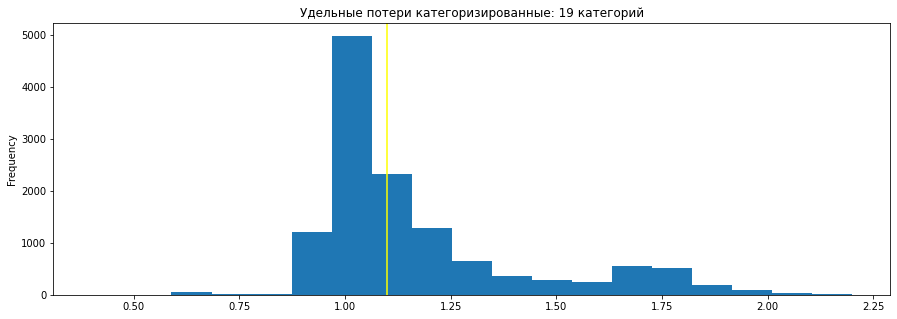

In [6]:
#Категоризируем целевую переменную:
df['Удельные потери категории'] = (df['Удельные_потери']// 0.1 * 0.1)
# np.unique(target_bins)
# target_bins.describe()
# len(target_bins.value_counts())
plt.title('Удельные потери категоризированные: ' + str(len(df['Удельные потери категории'].unique())) + ' категорий')
df['Удельные потери категории'].plot.hist(bins = (len(df['Удельные потери категории'].unique())), figsize=(15, 5))
plt.axvline(x=1.1, ymin=0, ymax=1, color = 'yellow')
plt.show()

In [7]:
# Создаем категориальный признак "Качество" - 1|0
df['Качество'] = np.where(df['Удельные_потери'] < 1.1, 0, 1)
# df[['Удельные_потери','Качество']]

#### Первичная обработка датасета:
<a id='200'></a>

In [8]:
#Конвертируем столбцы с временем в формат datetime64
df['Поступление_в_технологическую_секцию'] = pd.to_datetime(df['Поступление_в_технологическую_секцию'], utc=True)
df['Выезд_из_технологической_секции'] = pd.to_datetime(df['Выезд_из_технологической_секции'], utc=True)
df['Начало непрерывного отжига'] = pd.to_datetime(df['Начало непрерывного отжига'], utc=True)
df['Окончание непрерывного отжига'] = pd.to_datetime(df['Окончание непрерывного отжига'], utc=True)
#Конвертируем значения во float
df['T_Этап2_зона6'] = df['T_Этап2_зона6'].astype(float)
df['Кислород_конец'] = df['Кислород_конец'].astype(float)
#Зачищаем значения столбца 'Толщина_перед_смоткой' + конвертируем во float
# можно вычистить вручную, используя  метод .isdigit():
# df['Толщина_перед_смоткой'] = df['Толщина_перед_смоткой'].map(lambda x: x.lstrip('тредн тренд _ eнд .'))
# Но в данном случае воспользуемся строковыми методами: 
df['Толщина_перед_смоткой'] = df['Толщина_перед_смоткой'].map(lambda x: x[x.find('2,'):])
df['Толщина_перед_смоткой'] = df['Толщина_перед_смоткой'].str.replace(',','.', regex=True).astype(float)

### Восстанавливаем пропущенные значения:

#### Этап "Обезуглероживание" - восстанавливаем данные о времени обработки в технологической секции и непрерывного отжига
<a id='500'></a>

In [9]:
# проверяем выбросы данных о времени
df_time = df[['Поступление_в_технологическую_секцию', 'Выезд_из_технологической_секции',
   'Начало непрерывного отжига', 'Окончание непрерывного отжига']]
df_time[(df_time['Поступление_в_технологическую_секцию'].notnull())\
        & (df_time['Выезд_из_технологической_секции'].notnull())\
       & (df_time['Начало непрерывного отжига'].notnull())\
        & (df_time['Окончание непрерывного отжига'].notnull())].count()
# Нет строк с полностью отсуствующими данными о времени

Поступление_в_технологическую_секцию    0
Выезд_из_технологической_секции         0
Начало непрерывного отжига              0
Окончание непрерывного отжига           0
dtype: int64

In [10]:
#Добавляем поля - разница во времени для времени обработки в технологической секции и непрерывного отжига
df_time.insert(2, 'Tech_delta', ((df_time['Выезд_из_технологической_секции'] - df_time['Поступление_в_технологическую_секцию']).dt.total_seconds()))
df_time.insert(5, 'Аnnealing_delta', ((df_time['Окончание непрерывного отжига'] - df_time['Начало непрерывного отжига']).dt.total_seconds()))
df_time.insert(6, 'Удельные_потери', df['Удельные_потери'])
df_time.insert(7, 'Номер партии', df['Номер партии'])

In [11]:
#восстанавливаем значения времени времени обработки в технологической секции и непрерывного отжига по номеру партии
Аnnealing_delta = df_time[(df_time['Начало непрерывного отжига'].notnull()) & (df_time['Окончание непрерывного отжига'].notnull())].groupby(['Начало непрерывного отжига', 'Окончание непрерывного отжига', 'Аnnealing_delta', 'Номер партии']).count().reset_index()[['Начало непрерывного отжига', 'Окончание непрерывного отжига','Аnnealing_delta', 'Номер партии']]
Tech_delta = df_time[(df_time['Поступление_в_технологическую_секцию'].notnull()) & (df_time['Выезд_из_технологической_секции'].notnull())].groupby([ 'Поступление_в_технологическую_секцию', 'Выезд_из_технологической_секции', 'Tech_delta', 'Номер партии']).count().reset_index()[['Поступление_в_технологическую_секцию', 'Выезд_из_технологической_секции', 'Tech_delta', 'Номер партии']]
A_T_delta = Аnnealing_delta.merge(Tech_delta, on='Номер партии', how='left')
A_T_delta.head(5)

,Начало непрерывного отжига,Окончание непрерывного отжига,Аnnealing_delta,Номер партии,Поступление_в_технологическую_секцию,Выезд_из_технологической_секции,Tech_delta
0,2017-08-01 11:53:29+00:00,2017-08-01 12:39:24+00:00,2755.0,522374,2017-08-01 11:53:29+00:00,2017-08-01 12:39:24+00:00,2755.0
1,2017-08-01 11:53:29+00:00,2017-08-01 12:39:24+00:00,2755.0,522375,2017-08-01 11:53:29+00:00,2017-08-01 12:39:24+00:00,2755.0
2,2017-08-01 11:53:29+00:00,2017-08-01 12:39:24+00:00,2755.0,522380,2017-08-01 11:53:29+00:00,2017-08-01 12:39:24+00:00,2755.0
3,2017-08-01 12:39:24+00:00,2017-08-01 13:23:14+00:00,2630.0,522355,2017-08-01 12:39:24+00:00,2017-08-01 13:23:14+00:00,2630.0
4,2017-08-01 12:39:24+00:00,2017-08-01 13:23:14+00:00,2630.0,522356,2017-08-01 12:39:24+00:00,2017-08-01 13:23:14+00:00,2630.0


In [12]:
df_rest_time = df.merge(A_T_delta[['Начало непрерывного отжига', 'Окончание непрерывного отжига', 'Аnnealing_delta','Поступление_в_технологическую_секцию','Выезд_из_технологической_секции','Tech_delta','Номер партии']], on='Номер партии', how='left')
# df_2[['Поступление_в_технологическую_секцию_x', 'Выезд_из_технологической_секции_y', 'Поступление_в_технологическую_секцию_y', 'Выезд_из_технологической_секции_y' ]][df_2['Поступление_в_технологическую_секцию_x'].isnull()]
df_rest_time[['Начало непрерывного отжига_y', 'Окончание непрерывного отжига_y','Поступление_в_технологическую_секцию_y','Выезд_из_технологической_секции_y','Tech_delta']].head(5)

,Начало непрерывного отжига_y,Окончание непрерывного отжига_y,Поступление_в_технологическую_секцию_y,Выезд_из_технологической_секции_y,Tech_delta
0,2017-08-01 13:23:14+00:00,2017-08-01 14:07:58+00:00,2017-08-01 13:23:14+00:00,2017-08-01 14:07:58+00:00,2684.0
1,2017-08-01 13:23:14+00:00,2017-08-01 14:07:58+00:00,2017-08-01 13:23:14+00:00,2017-08-01 14:07:58+00:00,2684.0
2,2017-08-01 13:23:14+00:00,2017-08-01 14:07:58+00:00,2017-08-01 13:23:14+00:00,2017-08-01 14:07:58+00:00,2684.0
3,2017-08-01 13:23:14+00:00,2017-08-01 14:07:58+00:00,2017-08-01 13:23:14+00:00,2017-08-01 14:07:58+00:00,2684.0
4,2017-08-01 13:23:14+00:00,2017-08-01 14:07:58+00:00,2017-08-01 13:23:14+00:00,2017-08-01 14:07:58+00:00,2684.0


In [13]:
#обновляем данные в основном датасете:
df[['Поступление_в_технологическую_секцию', 'Выезд_из_технологической_секции', 'Начало непрерывного отжига', 'Окончание непрерывного отжига', 'Разница времени в тех секции']]\
= df_rest_time[['Поступление_в_технологическую_секцию_y','Выезд_из_технологической_секции_y', 'Начало непрерывного отжига_y', 'Окончание непрерывного отжига_y','Tech_delta']]

#### Этап 'Обезуглероживание' восстанавливаем данные по 'Точке росы':
<a id='600'></a>

In [14]:
# Отсутствует часть данных по точке росы:столбцы 'Точка_росы_Этап1_зона1', 'Точка_росы_Этап1_зона2' причем если для строки есть данные по
# 'Точка_росы_Этап1_зона1' то есть данные по 'Точка_росы_Этап1_зона2' и наоборот.
# Данные столбца 'Точка_росы_Этап4_зона1' - отрицательные, предположим что это ошибка данных и линейно экстраполируем 
# по столбцам 'Точка_росы_Этап2_зона2', 'Точка_росы_Этап2_зона3'
# df[['Точка_росы_Этап1_зона1', 'Точка_росы_Этап1_зона2', 'Точка_росы_Этап2_зона2', 'Точка_росы_Этап2_зона3', 'Точка_росы_Этап4_зона1']].describe()
df_dew = df[['Точка_росы_Этап1_зона1', 'Точка_росы_Этап1_зона2', 'Точка_росы_Этап2_зона2', 'Точка_росы_Этап2_зона3']]
df_dew[df['Точка_росы_Этап1_зона1'].notna()]

,Точка_росы_Этап1_зона1,Точка_росы_Этап1_зона2,Точка_росы_Этап2_зона2,Точка_росы_Этап2_зона3
Индекс,,,,
739,63.650000,NaN,61.111507,59.981507
740,63.650000,NaN,61.120000,59.981925
741,63.650000,NaN,61.114832,59.941723
742,63.650000,NaN,61.093661,59.955491
743,63.651938,NaN,61.111938,59.976124
...,...,...,...,...
11457,63.176374,NaN,59.859396,57.950000
11458,63.199093,NaN,59.860000,57.969093
11459,63.190302,NaN,59.850302,57.960302


In [15]:
df_dew = df_dew.interpolate(method='linear', limit_direction='both', axis=1)
# Проверяем что данные восстановились
# df_dew[df['Точка_росы_Этап1_зона1'].notna()]
# Линейной экстраполяцией заполняем данные в столбцах 'Точка_росы_Этап1_зона1' и 'Точка_росы_Этап4_зона1'
df_dew['Точка_росы_Этап1_зона1'] = df ['Точка_росы_Этап1_зона1']
df_dew['Точка_росы_Этап1_зона1'] = df_dew['Точка_росы_Этап1_зона1'].fillna((2 * df_dew['Точка_росы_Этап1_зона2']) - df_dew['Точка_росы_Этап2_зона2'])
df_dew['Точка_росы_Этап4_зона1'] = (2 * df_dew['Точка_росы_Этап2_зона3']) - df_dew['Точка_росы_Этап2_зона2']

In [16]:
# перезаписываем основной датасет
df[['Точка_росы_Этап1_зона1', 'Точка_росы_Этап1_зона2', 'Точка_росы_Этап2_зона2', 'Точка_росы_Этап2_зона3', 'Точка_росы_Этап4_зона1']]= df_dew[['Точка_росы_Этап1_зона1', 'Точка_росы_Этап1_зона2', 'Точка_росы_Этап2_зона2', 'Точка_росы_Этап2_зона3', 'Точка_росы_Этап4_зона1']]
df[['Точка_росы_Этап1_зона1', 'Точка_росы_Этап1_зона2', 'Точка_росы_Этап2_зона2', 'Точка_росы_Этап2_зона3', 'Точка_росы_Этап4_зона1']].head(5)

,Точка_росы_Этап1_зона1,Точка_росы_Этап1_зона2,Точка_росы_Этап2_зона2,Точка_росы_Этап2_зона3,Точка_росы_Этап4_зона1
Индекс,,,,,
0,66.355520,63.680000,61.004480,59.753280,58.502080
1,66.324853,63.680000,61.035147,59.690293,58.345440
2,66.360000,63.678693,60.997387,59.612160,58.226933
3,66.355800,63.668600,60.981400,59.561400,58.141400
4,66.330000,63.658507,60.987013,59.578960,58.170907


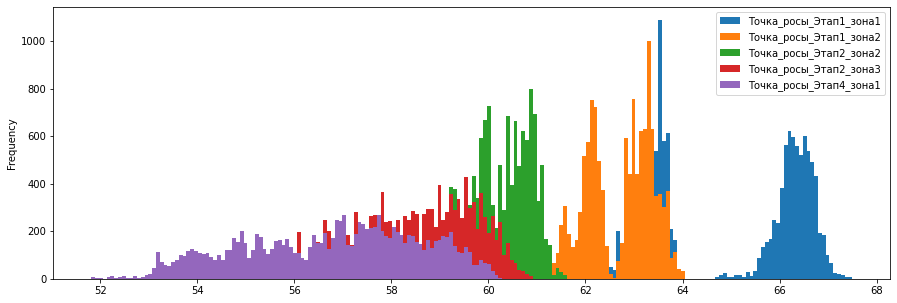

In [17]:
df[['Точка_росы_Этап1_зона1', 'Точка_росы_Этап1_зона2', 'Точка_росы_Этап2_зона2', 'Точка_росы_Этап2_зона3', 'Точка_росы_Этап4_зона1']].plot.hist(bins=200,legend=True,figsize=(15, 5))
plt.show()

#### Этап 'Обезуглероживание' восстанавливаем данные по CO:
<a id='700'></a>

In [18]:
# df[['CO_Этап1_зона1', 'CO_Этап1_зона2']][df['CO_Этап1_зона2'].isna()].groupby('CO_Этап1_зона1').count()
df[['CO_Этап1_зона1', 'CO_Этап1_зона2']][df['CO_Этап1_зона1'].isna()].groupby('CO_Этап1_зона2').count()
# отбрасываем данные столбца 'CO_Этап1_зона1'

,CO_Этап1_зона1
CO_Этап1_зона2,
0.033293,0
0.047328,0
0.065306,0
0.083284,0
0.101261,0
...,...
1.640000,0
1.646867,0
1.650000,0


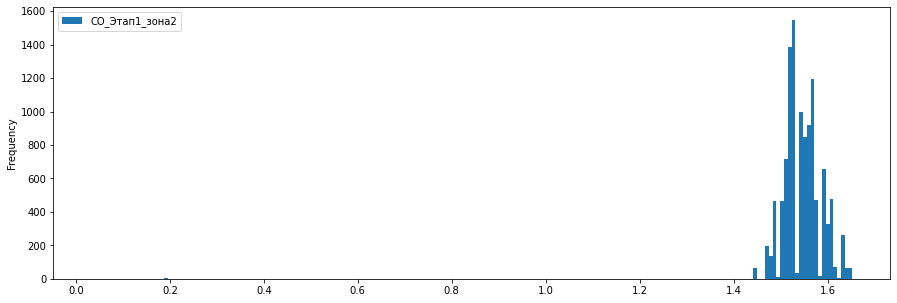

In [19]:
df['CO_Этап1_зона2'].plot.hist(bins=200,legend=True,figsize=(15, 5))
plt.show()

In [20]:
df['CO_Этап1_зона2'] = df['CO_Этап1_зона2'].fillna(df['CO_Этап1_зона2'].median())

In [21]:
df[['CO_Этап1_зона1', 'CO_Этап1_зона2','CO_Этап2_зона1','CO_Этап2_зона2','CO_Этап2_зона3','CO_Этап2_зона4', 'CO_Этап2_зона5']].describe()

,CO_Этап1_зона1,CO_Этап1_зона2,CO_Этап2_зона1,CO_Этап2_зона2,CO_Этап2_зона3,CO_Этап2_зона4,CO_Этап2_зона5
count,1315.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000
mean,1.570991,1.541079,1.680891,1.112086,0.442210,0.213710,1.569600
std,0.028883,0.080620,0.046753,0.075733,0.047472,0.036463,0.025979
min,1.490000,0.033293,1.530000,0.790000,0.280000,0.080034,0.000000
25%,1.560000,1.520000,1.650000,1.080000,0.420000,0.190000,1.570484
50%,1.580000,1.540000,1.680000,1.110000,0.440000,0.210000,1.570640
75%,1.581895,1.570000,1.720000,1.160000,0.470000,0.230000,1.570693
max,1.630000,1.652933,1.800000,1.290000,0.699000,0.440000,1.570718


In [22]:
# Проверяем, чтобы не осталось строковых значений 
# df.select_dtypes(include=[np.object_])
# df.info(verbose=True, show_counts=True)
df.describe()

,Номер партии,Номер партии_АСУТП,Номер плавки,Номер рулона,Длина_1,Длина_2,Длина_3,Длина_4,Длина_5,Углерод_начало,Длина_Обезуглероживание,Толщина_средняя,Длина_ГП,Длина_МС,Длина_Н,Азот_конец,Азот_начало,Азот_среднее,Кислород_начало,N,Al,Номер_бригады,Длина__м,ЗВО,CO_Этап2_зона1,CO_Этап2_зона2,CO_Этап2_зона3,CO_Этап2_зона4,CO2_Этап1,Калиброванное_значение_CO2_Этап2_зона4,Si,Mn,Cu,NH3_Этап3_зона3,T_Этап3_зона4,Настройка_датчика_CO2_Этап2_зона4,Ni,Кислород_конец,Кислород_среднее,Sn,Средние_магнитные_потери,Коэффициент_свойств_стали,S,Датчик_механических_свойств,Углерод_конец,H2_Этап3_зона3,Скорость_технологической_секции,H2_Этап4_зона1,H2_Этап2_зона1,H2_Этап2_зона2,H2_Этап2_зона3,H2_Этап2_зона4,H2_Этап3_зона1,H2_Этап3_зона2,NH3_Этап3_зона1,NH3_Этап3_зона2,CO_Этап2_зона5,T_Этап1_зона6,Углерод_среднее,Т_Этап5_зона1,Т_Этап5_зона2,Т_Этап4_зона1,Т_Этап4_зона2,T_Этап1_зона1,T_Этап1_зона2,T_Этап1_зона3,T_Этап1_зона4,T_Этап1_зона5,T_Этап2_зона1,T_Этап2_зона2,T_Этап2_зона3,T_Этап2_зона4,T_Этап2_зона5,T_Этап2_зона6,T_Этап2_зона7,T_Этап3_зона1,T_Этап3_зона2,T_Этап3_зона3,T_в_начале_нормализации,T_в_середине_нормализации_1,T_в_середине_нормализации_2,T_в_конце_нормализации,T_проход_1,T_проход_3,T_проход_5,T_проход_2,T_проход_4,Температура_полосы_на_выходе_реверсивного стана,Ti,Длина_Азотирование,Толщина_МС,Точка_росы_Этап4_зона1,Точка_росы_Этап2_зона2,Точка_росы_Этап2_зона3,T_за_средней_клетью,T_конца_проката,T_рулона,Тренд_температуры_перед_реверсивным_станом,Толщина_перед_смоткой,C,Удельные_потери,F,Cr,Водород_начало,Водород_среднее,CO2_Этап2_зона5,H2_Этап2_зона5,Точка_росы_Этап1_зона1,Точка_росы_Этап1_зона2,CO_Этап1_зона1,CO_Этап1_зона2,H2_Этап1,CO2_Этап2_зона1,CO2_Этап2_зона3,Удельные потери категории,Качество,Разница времени в тех секции
count,12791.000000,12791.000000,1.279100e+04,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.00,12791.000000,12791.000000,12791.000000,12791.00,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.0,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,1315.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000
mean,522363.075365,580805.018138,1.717428e+06,41.332265,735.243324,1092.121597,1749.815388,2504.335596,3742.866852,0.003309,3725.768718,24.541787,548.489827,3690.181378,736.991503,0.022509,0.022879,0.022694,0.078361,0.007511,0.029056,1.916738,0.509686,3.390978,1.680891,1.112086,0.442210,0.213710,0.095109,-0.020061,3.314503,0.143204,0.01,0.014216,500.963177,0.000075,0.01,0.081098,0.079730,0.002675,1.217264,2.163240,0.005381,58.986071,0.003253,0.102041,67.969620,50.411388,68.722156,67.592525,64.743067,53.956574,35.050295,17.152891,0.030372,0.916644,1.569600,0.0,0.003281,746.051056,745.473127,840.023134,840.029106,929.946052,929.956967,909.991126,900.006833,870.037592,840.016084,840.011888,839.993954,840.002665,840.017652,

<a id='900'></a>
#### Убираем выбросы данных:

In [23]:
# Убираем выбросы - заменяем на медиану
df.loc[df['H2_Этап1'] < 60, 'H2_Этап1'] = df['H2_Этап1'].median()
df.loc[df['H2_Этап2_зона1'] < 68, 'H2_Этап2_зона1'] = df['H2_Этап2_зона1'].median()
df.loc[df['H2_Этап2_зона4'] < 50, 'H2_Этап2_зона4'] = df['H2_Этап2_зона4'].median()
df.loc[df['CO_Этап1_зона2'] < 1.4, 'CO_Этап1_зона2'] = df['CO_Этап1_зона2'].median()
df.loc[df['T_рулона'] > 589, 'T_рулона'] = df['T_рулона'].median()
df.loc[df['T_проход_1'] < 90, 'T_проход_1'] = df['T_проход_1'].median()
df.loc[df['T_проход_2'] < 160, 'T_проход_2'] = df['T_проход_2'].median()
df.loc[df['T_проход_3'] < 160, 'T_проход_3'] = df['T_проход_3'].median()
df.loc[df['T_проход_4'] < 160, 'T_проход_4'] = df['T_проход_4'].median()
df.loc[df['T_проход_5'] < 160, 'T_проход_5'] = df['T_проход_5'].median()

df.loc[df['T_Этап1_зона3'] < 907, 'T_Этап1_зона3'] = df['T_Этап1_зона3'].median()
df.loc[df['T_Этап1_зона4'] < 896, 'T_Этап1_зона4'] = df['T_Этап1_зона4'].median()
df.loc[df['T_Этап1_зона5'] < 866, 'T_Этап1_зона5'] = df['T_Этап1_зона5'].median()
df.loc[df['T_Этап2_зона1'] < 838, 'T_Этап2_зона1'] = df['T_Этап2_зона1'].median()
df.loc[df['T_Этап2_зона2'] < 837, 'T_Этап2_зона2'] = df['T_Этап2_зона2'].median()

df.loc[df['Датчик_механических_свойств'] < 30, 'Датчик_механических_свойств'] = df['Датчик_механических_свойств'].median()

df.loc[df['Температура_полосы_на_выходе_реверсивного стана'] < 60, 'Температура_полосы_на_выходе_реверсивного стана'] = df['Температура_полосы_на_выходе_реверсивного стана'].median()
df.loc[df['Тренд_температуры_перед_реверсивным_станом'] < 310, 'Тренд_температуры_перед_реверсивным_станом'] = df['Тренд_температуры_перед_реверсивным_станом'].median()

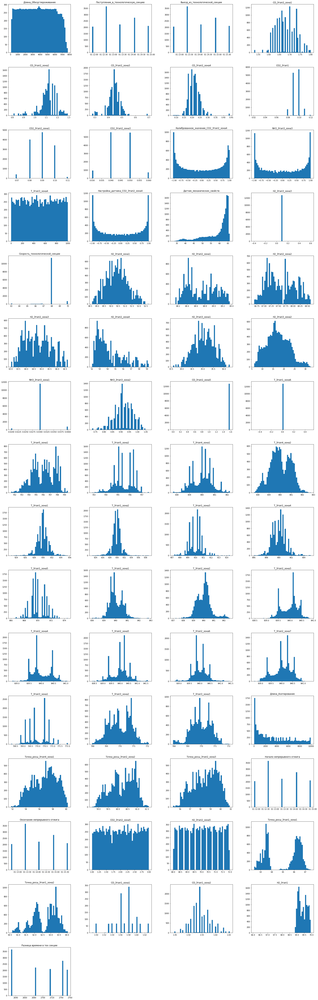

In [24]:
df[stages['Обезуглероживание']].hist(figsize=(30,100), bins = 50, grid = False, layout = (16,4))
plt.show()

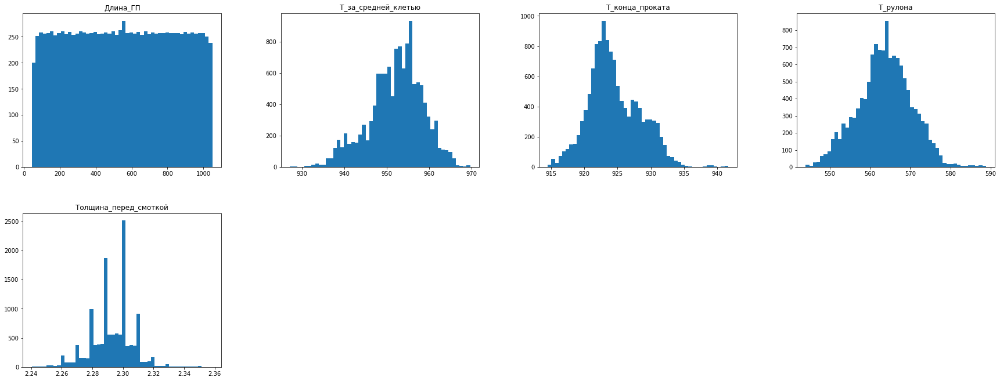

In [25]:
df[stages['Горячий прокат']].hist(figsize=(30,100), bins = 50, grid = False, layout = (16,4))
plt.show()

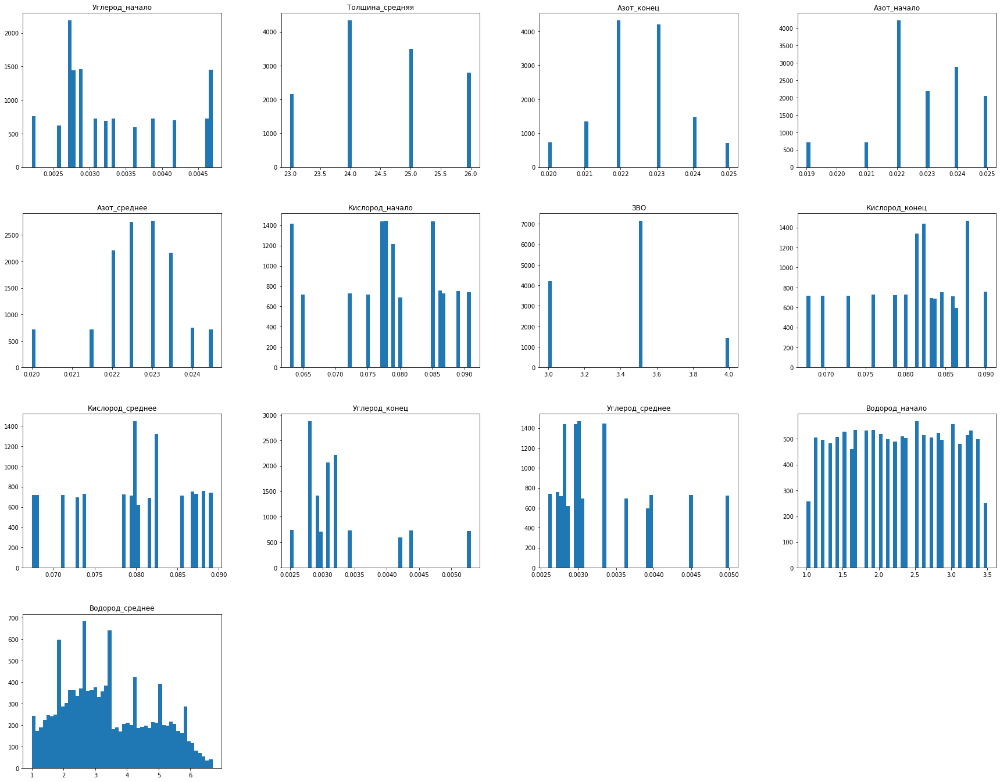

In [26]:
df[stages['Химия итог']].hist(figsize=(30,100), bins = 50, grid = False, layout = (16,4))
plt.show()

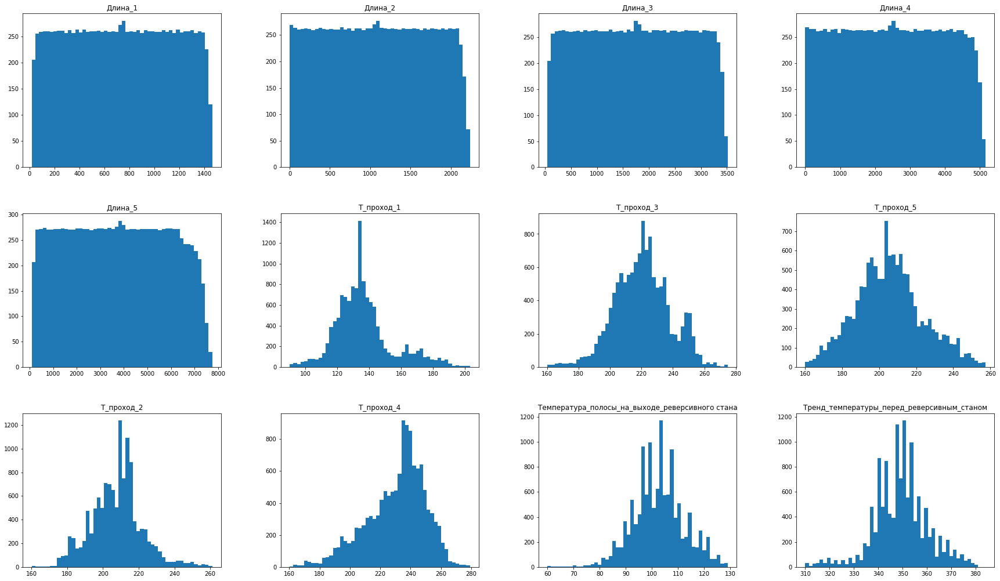

In [27]:
df[stages['Холодный прокат']].hist(figsize=(30,100), bins = 50, grid = False, layout = (16,4))
plt.show()

Горячий прокат


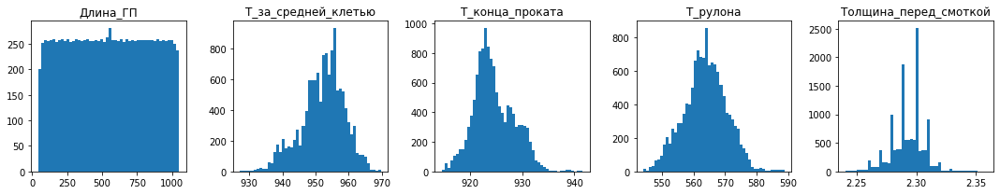

Магнитные свойства


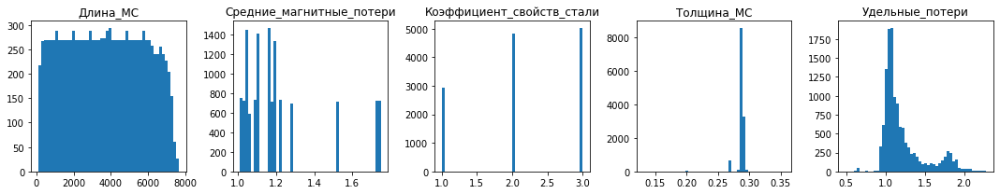

Нормализация


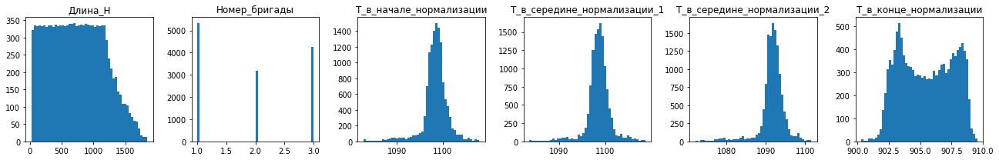

Обезуглероживание


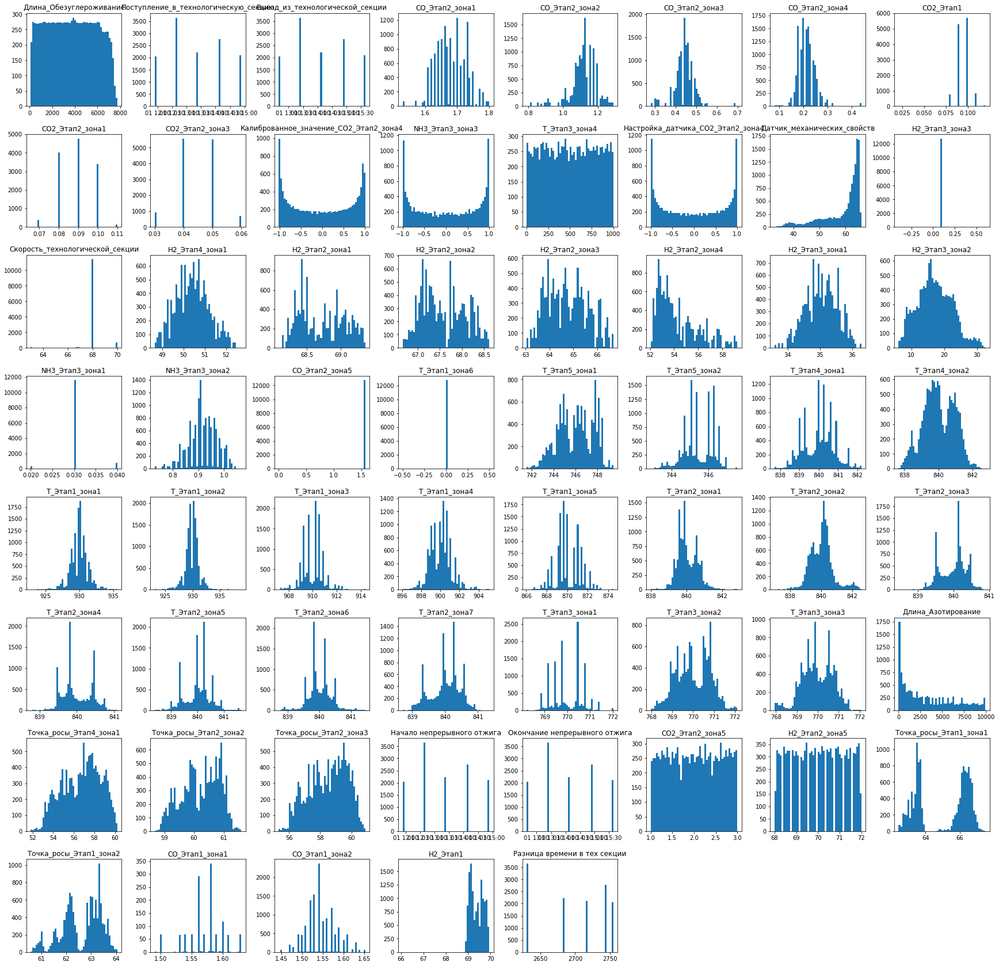

Общие данные


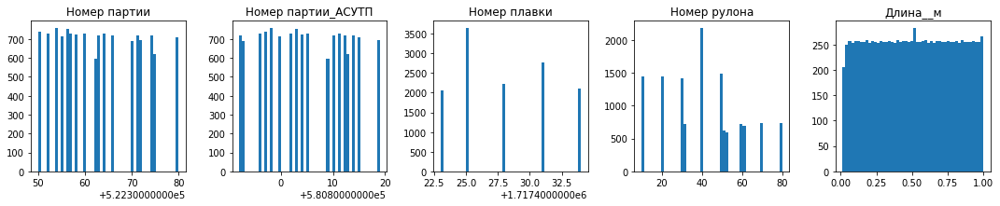

Химия итог


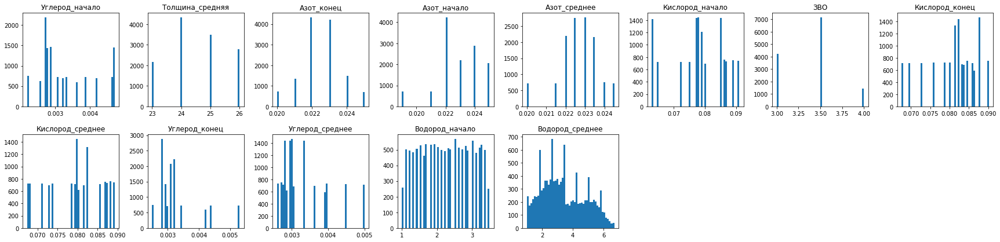

Химия плавки


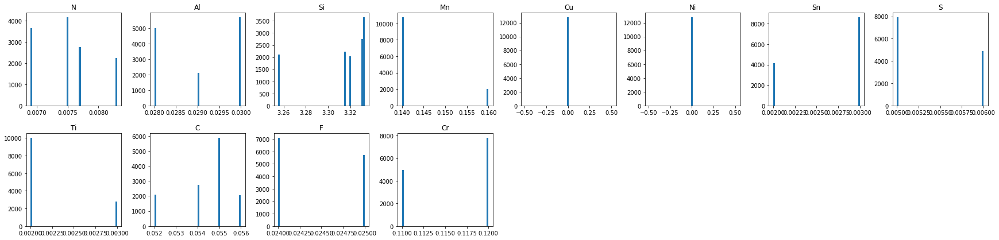

Холодный прокат


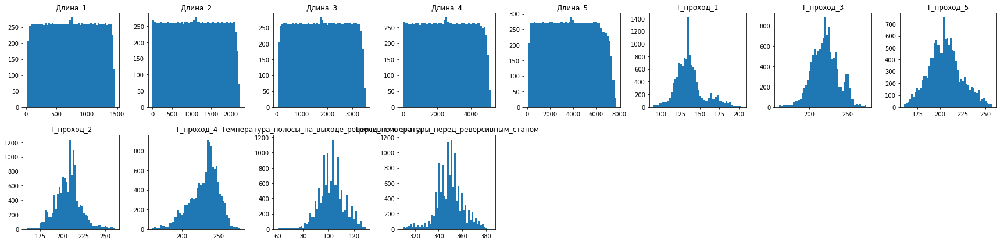

In [28]:
for stage in stages:
    print (stage)
    df[stages[stage]].hist(figsize=(30,30), bins = 50, grid = False, layout = (8,8))
    plt.show()

<a id='1000'></a>
#### Проверяем группировки данных:

In [29]:
# df.groupby(['Номер партии', 'Номер рулона']).count()
df.groupby(['Номер рулона', 'Номер плавки', 'Номер партии', ]).count()
# номера рулонов повтрояются в разных плавках

Номер партии_АСУТП  Длина_1  Длина_2  \
Номер рулона Номер плавки Номер партии                                         
10           1717425      522355                       713      713      713   
             1717431      522364                       727      727      727   
20           1717423      522374                       720      720      720   
             1717425      522357                       728      728      728   
30           1717425      522360                       730      730      730   
             1717434      522370                       691      691      691   
32           1717431      522363                       719      719      719   
40           1717423      522380                       710      710      710   
             1717425      522356                       751      751      751   
             1717434      522371                       720      720      720   
50           1717425      522358                       726      726      726   
             1717428      522354                       758      758      758   
51           1717423      522375                       619      619      619   
52           1717431      522362                       594      594      594   
60           1717431      522366                       720      720      720   
61           1717434      522372                       696      696      696   
70           1717428      522350                       739      739      739   
80           1717428      522352                       730      730      730   

                                        Длина_3  Длина_4  Длина_5  \
Номер рулона Номер плавки Номер партии                              
10           1717425      522355            713      713      713   
             1717431      522364            727      727      727   
20           1717423      522374            720      720      720   
             1717425      522357            728      728      728   
30           1717425      522360            730      730      730   
             1717434      522370            691      691      691   
32           1717431      522363            719      719      719   
40           1717423      522380            710      710      710   
             1717425      522356            751      751      751   
             1717434      522371            720      720      720   
50           1717425      522358            726      726      726   
             1717428      522354            758      758      758   
51           1717423      522375            619      619      619   
52           1717431      522362            594      594      594   
60           1717431      522366            720      720      720   
61           1717434      522372            696      696      696   
70           1717428      522350            739      739      739   
80           1717428      522352            730      730      730   

                                        Углерод_начало  \
Номер рулона Номер плавки Номер партии                   
10           1717425      522355                   713   
             1717431      522364                   727   
20           1717423      522374                   720   
             1717425      522357                   728   
30           1717425      522360                   730   
             1717434      522370                   691   
32           1717431      522363                   719   
40           1717423      522380                   710   
             1717425      522356                   751   
             1717434      522371                   720   
50           1717425      522358                   726   
             1717428      522354                   758   
51           1717423      522375                   619   
52           1717431      522362                   594   
60           1717431      522366                   720   
61           1717434      522372                   696   
70           1

<a id='1100'></a>
#### Выборочно проверяем распределение целевой переменной между столбцами:

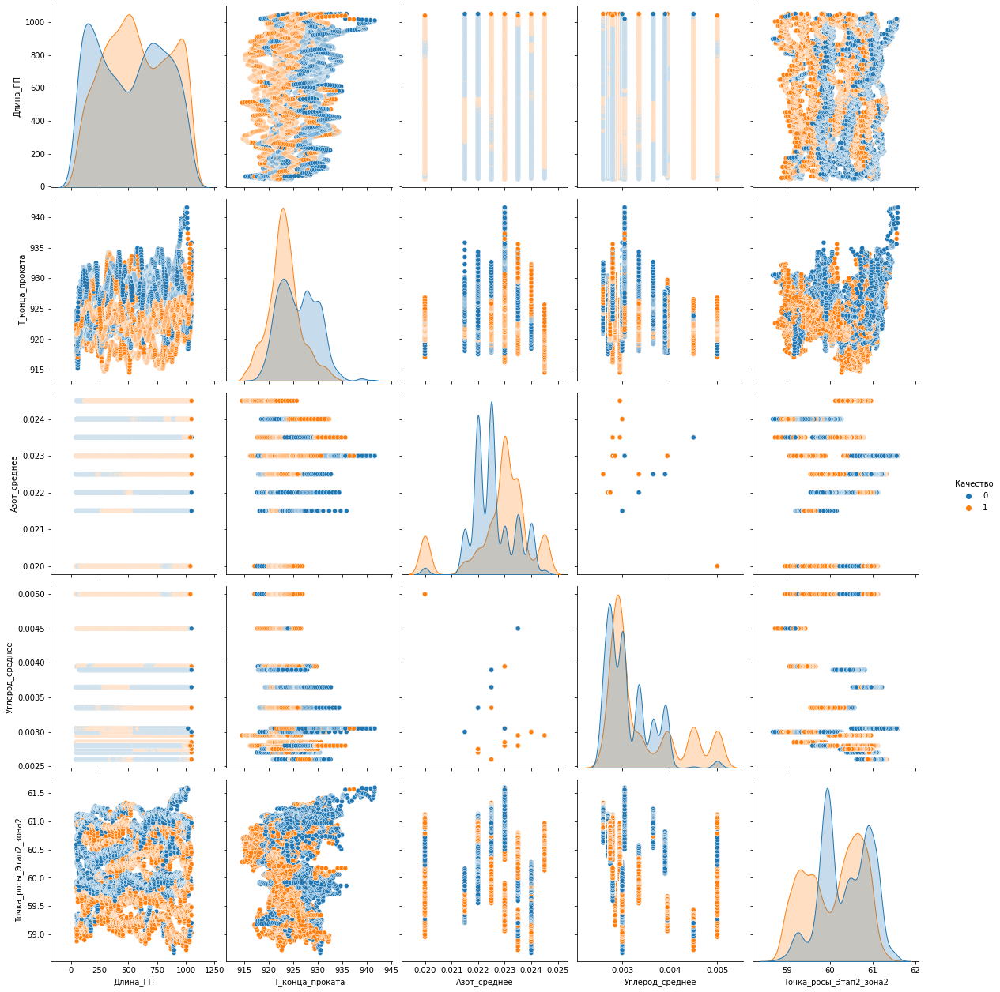

In [30]:
# для отдельной партии
df_var = df[df['Номер партии'] == 522370]
var = df_var[['Длина_ГП', 'T_конца_проката', 'Азот_среднее', 'Углерод_среднее', 'Точка_росы_Этап2_зона2']]

grid = sns.pairplot(df, vars=var, hue='Качество', dropna=True)
grid.fig.set_figwidth(18)
grid.fig.set_figheight(18)
plt.show()

In [31]:
# Анализируем связи между 2 столбцами
# grid = sns.jointplot(df['H2_Этап2_зона2'], df['H2_Этап2_зона1'], kind='reg')
# # grid = sns.jointplot(df['Удельные_потери'], df['Длина__м'])
# # grid = sns.jointplot(df['Номер партии'], df['Удельные_потери'], kind ='kde') - график высот
# grid.fig.set_figwidth(8)
# grid.fig.set_figheight(8)
# plt.show()

<a id='1150'></a>
### Анализируем выбросы и консистентность данных по этапам технологического процесса: 

###### Общие данные:

In [32]:
df[stages ['Общие данные']].describe()
# выбросов не заметно

,Номер партии,Номер партии_АСУТП,Номер плавки,Номер рулона,Длина__м
count,12791.000000,12791.000000,1.279100e+04,12791.000000,12791.000000
mean,522363.075365,580805.018138,1.717428e+06,41.332265,0.509686
std,8.543076,7.844949,3.800574e+00,19.326995,0.283189
min,522350.000000,580792.000000,1.717423e+06,10.000000,0.014245
25%,522356.000000,580798.000000,1.717425e+06,30.000000,0.264975
50%,522362.000000,580804.000000,1.717428e+06,40.000000,0.510499
75%,522371.000000,580812.000000,1.717431e+06,52.000000,0.754692
max,522380.000000,580819.000000,1.717434e+06,80.000000,1.000000


#### 1 - Химия плавки:

In [33]:
df[stages ['Химия плавки']].describe()
# выбросов не заметно

,N,Al,Si,Mn,Cu,Ni,Sn,S,Ti,C,F,Cr
count,12791.000000,12791.000000,12791.000000,12791.000000,12791.00,12791.00,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000
mean,0.007511,0.029056,3.314503,0.143204,0.01,0.01,0.002675,0.005381,0.002216,0.054450,0.024445,0.116101
std,0.000472,0.000912,0.027285,0.007336,0.00,0.00,0.000468,0.000486,0.000411,0.001248,0.000497,0.004877
min,0.006900,0.028000,3.255000,0.140000,0.01,0.01,0.002000,0.005000,0.002000,0.052000,0.024000,0.110000
25%,0.006900,0.028000,3.315000,0.140000,0.01,0.01,0.002000,0.005000,0.002000,0.054000,0.024000,0.110000
50%,0.007500,0.029000,3.331000,0.140000,0.01,0.01,0.003000,0.005000,0.002000,0.055000,0.024000,0.120000
75%,0.007700,0.030000,3.333000,0.140000,0.01,0.01,0.003000,0.006000,0.002000,0.055000,0.025000,0.120000
max,0.008300,0.030000,3.333000,0.160000,0.01,0.01,0.003000,0.006000,0.003000,0.056000,0.025000,0.120000


#### 2 - Горячий прокат:

In [34]:
df[stages ['Горячий прокат']].describe()
# выбросов не заметно

,Длина_ГП,T_за_средней_клетью,T_конца_проката,T_рулона,Толщина_перед_смоткой
count,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000
mean,548.489827,952.169263,924.533208,563.718517,2.293299
std,288.111988,6.396713,3.911231,6.723054,0.013590
min,44.142857,927.192308,914.519257,544.039062,2.240434
25%,299.376499,948.346882,921.888656,559.589843,2.285595
50%,549.520000,952.905983,923.887978,563.857488,2.294156
75%,797.555773,956.414174,927.265071,568.105225,2.300000
max,1050.000000,969.748571,941.622857,588.849131,2.358462


In [35]:
df[stages ['Горячий прокат']][(df['T_за_средней_клетью'] > df['T_конца_проката']) & 
                              (df['T_конца_проката'] > df['T_рулона'])]
# порядок значений температур - соблюдается

,Длина_ГП,T_за_средней_клетью,T_конца_проката,T_рулона,Толщина_перед_смоткой
Индекс,,,,,
0,46.320000,948.368000,922.787048,563.857488,2.300000
1,47.680000,948.232000,922.812952,563.857488,2.300000
2,49.040000,948.096000,922.838857,563.857488,2.300000
3,50.400000,948.000000,922.776190,587.416190,2.300000
4,51.760000,948.000000,922.500952,585.916952,2.300000
...,...,...,...,...,...
12786,1034.365411,958.111576,932.444630,563.857488,2.311269
12787,1035.774059,960.083682,933.233473,563.857488,2.308452
12788,1037.182706,962.055788,934.022315,563.857488,2.305635


#### 3 - Нормализация:

In [36]:
df[stages ['Нормализация']].describe()
# выбросов не заметно

,Длина_Н,Номер_бригады,T_в_начале_нормализации,T_в_середине_нормализации_1,T_в_середине_нормализации_2,T_в_конце_нормализации
count,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000
mean,736.991503,1.916738,1098.419497,1098.564210,1091.619851,905.500405
std,426.759873,0.862036,2.817714,2.608075,3.356378,2.089861
min,25.000000,1.000000,1082.600000,1083.500000,1072.000000,900.300275
25%,375.461782,1.000000,1097.385059,1097.531972,1090.670722,903.575738
50%,722.400000,2.000000,1098.600000,1098.618841,1091.894922,905.470370
75%,1069.961193,3.000000,1099.721824,1099.692084,1093.171821,907.434187
max,1850.000000,3.000000,1108.094498,1108.696699,1101.593810,909.553138


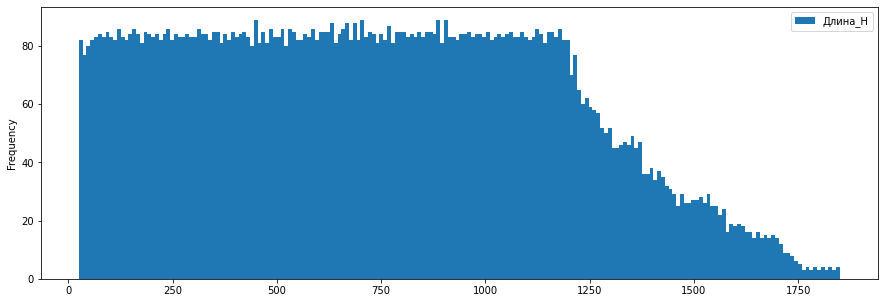

In [37]:
df['Длина_Н'].plot.hist(bins=200,legend=True,figsize=(15, 5))
plt.show()

In [38]:
df[stages ['Нормализация']][(df['T_в_начале_нормализации'] > df['T_в_конце_нормализации']) & 
                              (df['T_в_середине_нормализации_1'] > df['T_в_конце_нормализации']) & 
                            (df['T_в_середине_нормализации_2'] > df['T_в_конце_нормализации'])]
# порядок значений температур - соблюдается

,Длина_Н,Номер_бригады,T_в_начале_нормализации,T_в_середине_нормализации_1,T_в_середине_нормализации_2,T_в_конце_нормализации
Индекс,,,,,,
0,25.200000,1,1097.403200,1098.003200,1091.095200,902.112800
1,27.300000,1,1097.436800,1098.036800,1091.044800,902.247200
2,29.400000,1,1097.470400,1098.070400,1090.994400,902.381600
3,31.500000,1,1097.504000,1098.104000,1090.944000,902.516000
4,33.600000,1,1097.537600,1098.137600,1090.893600,902.650400
...,...,...,...,...,...,...
12786,1715.376569,1,1101.362343,1101.100837,1095.777824,908.308368
12787,1717.782427,1,1101.121757,1100.850628,1095.508368,908.106276
12788,1720.188285,1,1100.881172,1100.600418,1095.238912,907.904184


<AxesSubplot:>

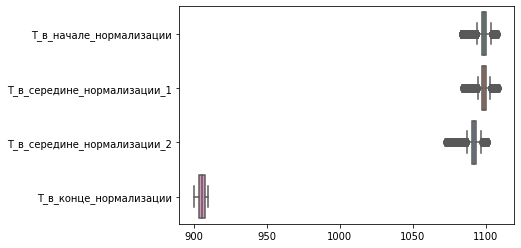

In [39]:
sns.boxplot(data=df[stages ['Нормализация']].drop(columns = ['Длина_Н', 'Номер_бригады']), orient="h", palette="Set2")

#### 4 - Холодный прокат:

In [40]:
df[stages ['Холодный прокат']][['Длина_1', 'T_проход_1', 'Длина_2', 'T_проход_2', 'Длина_3', 'T_проход_3',
                                'Длина_4', 'T_проход_4','Длина_5','T_проход_5', 
                                'Тренд_температуры_перед_реверсивным_станом', 
                                'Температура_полосы_на_выходе_реверсивного стана']].head(50).describe()
# Смотрим, как изменяются длины после этапов проката
# Смотрим, как изменяются температуры после этапов проката

,Длина_1,T_проход_1,Длина_2,T_проход_2,Длина_3,T_проход_3,Длина_4,T_проход_4,Длина_5,T_проход_5,Тренд_температуры_перед_реверсивным_станом,Температура_полосы_на_выходе_реверсивного стана
count,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
mean,70.810000,150.503565,2140.500000,180.481087,169.116667,222.742569,4942.176667,207.020541,370.353333,232.436173,359.560000,116.180000
std,28.280117,10.246926,43.732139,0.512916,67.541859,21.472204,100.972650,5.500401,147.911813,15.845324,2.071773,7.917147
min,23.280000,135.126582,2067.000000,178.910380,55.600000,181.605608,4772.473333,191.527300,121.760000,199.750038,355.000000,100.000000
25%,47.045000,142.310396,2103.750000,180.395475,112.358333,206.020147,4857.325000,203.948800,246.056667,220.435450,359.000000,110.250000
50%,70.810000,149.833125,2140.500000,180.535220,169.116667,228.814099,4942.176666,208.547115,370.353333,240.670386,360.000000,120.000000
75%,94.575000,161.773498,2177.250000,180.788170,225.875000,243.581888,5027.028333,210.967600,494.650000,245.034792,361.000000,122.750000
max,118.340000,167.146986,2214.000000,181.168000,282.633333,246.769000,5111.880000,213.508800,618.946667,250.057300,364.000000,125.000000


In [41]:
df[stages ['Холодный прокат']][['Длина_1', 'T_проход_1', 'Длина_2', 'T_проход_2', 'Длина_3', 'T_проход_3',
                                'Длина_4', 'T_проход_4','Длина_5','T_проход_5', 
                                'Тренд_температуры_перед_реверсивным_станом', 'Температура_полосы_на_выходе_реверсивного стана']]

,Длина_1,T_проход_1,Длина_2,T_проход_2,Длина_3,T_проход_3,Длина_4,T_проход_4,Длина_5,T_проход_5,Тренд_температуры_перед_реверсивным_станом,Температура_полосы_на_выходе_реверсивного стана
Индекс,,,,,,,,,,,,
0,23.280000,135.691170,2214.000000,178.910380,55.600000,181.605608,5111.880000,191.527300,121.760000,199.750038,364,100
1,25.220000,136.562104,2211.000000,179.181220,60.233333,183.547782,5104.953333,193.175100,131.906667,200.214333,364,100
2,27.160000,135.844343,2208.000000,179.271500,64.866667,183.523596,5098.026667,194.330724,142.053333,203.104308,363,102
3,29.100000,135.126582,2205.000000,179.271500,69.500000,183.784710,5091.100000,196.103200,152.200000,205.981120,361,103
4,31.040000,135.658006,2202.000000,179.786720,74.133333,185.731501,5084.173333,198.516900,162.346667,208.783392,361,104
...,...,...,...,...,...,...,...,...,...,...,...,...
12786,1407.105997,138.219449,12.178522,208.697296,3344.238494,175.695411,27.966527,165.003553,7247.341702,164.064000,368,82
12787,1409.079498,137.543761,9.133891,208.697296,3348.928870,172.380430,20.974895,234.480800,7257.506276,162.226500,371,81
12788,1411.052999,137.091563,8.000000,208.697296,3353.619247,170.785076,13.983264,234.480800,7267.670851,204.744200,374,76


In [42]:
# Температура растет от 1 к 5 проходу для 75% строк, для прочих T_проход_3' < 'T_проход_2' 
# Возможно перепутаны данные в столбцах 'Тренд_температуры_перед_реверсивным_станом', 'Температура_полосы_на_выходе_реверсивного стана'

df[stages ['Холодный прокат']][['Тренд_температуры_перед_реверсивным_станом', 'T_проход_1', 'T_проход_2', 'T_проход_3',
                                'T_проход_4','T_проход_5', 'Температура_полосы_на_выходе_реверсивного стана']][(df['T_проход_3'] > df['T_проход_2'])]

,Тренд_температуры_перед_реверсивным_станом,T_проход_1,T_проход_2,T_проход_3,T_проход_4,T_проход_5,Температура_полосы_на_выходе_реверсивного стана
Индекс,,,,,,,
0,364,135.691170,178.910380,181.605608,191.527300,199.750038,100
1,364,136.562104,179.181220,183.547782,193.175100,200.214333,100
2,363,135.844343,179.271500,183.523596,194.330724,203.104308,102
3,361,135.126582,179.271500,183.784710,196.103200,205.981120,103
4,361,135.658006,179.786720,185.731501,198.516900,208.783392,104
...,...,...,...,...,...,...,...
12687,352,140.669200,219.270210,219.995500,243.896593,179.718000,90
12688,352,140.669200,219.413700,219.995500,243.861700,180.749900,90
12783,361,143.404539,177.003616,179.041130,179.463255,171.185530,86


In [43]:
# df[(df['T_проход_3'] > df['T_проход_2'])].describe()

In [44]:
#  df[(df['T_проход_3'] < df['T_проход_2'])].describe()

In [45]:
#проверяем влияние разницы температур между последним и первым холодным прокатом на удельные потери
# также нет связей между удельными потерями и заготовками с 'T_проход_3' < 'T_проход_2' и 'T_проход_3' < 'T_проход_2' 
# прямой зависимости не видно - оставляем данные "как есть"
# df_1 = df
# df_1['delta_T5_T1'] = df['T_проход_5'] - df['T_проход_1']

# df_1.plot(x='Удельные_потери', y= 'delta_T5_T1', kind="scatter",figsize=(15, 6))
# plt.axvline(x=1.1, ymin=0, ymax=1, color = 'yellow')

# plt.grid()
# plt.show()

###### Холодный прокат - анализируем длины этапов проката:

In [46]:
df_lenght = df[['Длина_ГП', 'Длина_1', 'Длина_2', 'Длина_3','Длина_4', 'Длина_5']]
df_lenght
# Добавляем для сравнения фактическую длину на этапе горячей прокатки

,Длина_ГП,Длина_1,Длина_2,Длина_3,Длина_4,Длина_5
Индекс,,,,,,
0,46.320000,23.280000,2214.000000,55.600000,5111.880000,121.760000
1,47.680000,25.220000,2211.000000,60.233333,5104.953333,131.906667
2,49.040000,27.160000,2208.000000,64.866667,5098.026667,142.053333
3,50.400000,29.100000,2205.000000,69.500000,5091.100000,152.200000
4,51.760000,31.040000,2202.000000,74.133333,5084.173333,162.346667
...,...,...,...,...,...,...
12786,1034.365411,1407.105997,12.178522,3344.238494,27.966527,7247.341702
12787,1035.774059,1409.079498,9.133891,3348.928870,20.974895,7257.506276
12788,1037.182706,1411.052999,8.000000,3353.619247,13.983264,7267.670851


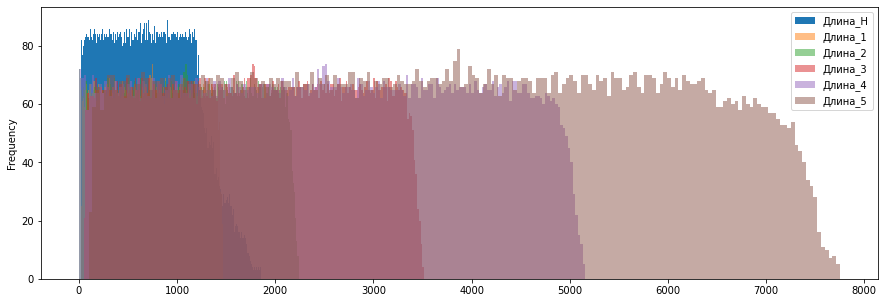

In [47]:
df['Длина_Н'].plot.hist(bins=200,legend=True,figsize=(15, 5))
df['Длина_1'].plot.hist(bins=200,legend=True,figsize=(15, 5), alpha = 0.5)
df['Длина_2'].plot.hist(bins=200,legend=True,figsize=(15, 5), alpha = 0.5)
df['Длина_3'].plot.hist(bins=200,legend=True,figsize=(15, 5), alpha = 0.5)
df['Длина_4'].plot.hist(bins=200,legend=True,figsize=(15, 5), alpha = 0.5)
df['Длина_5'].plot.hist(bins=200,legend=True,figsize=(15, 5), alpha = 0.5)
plt.show()

In [48]:
#  Переворачиваем столбцы с данными Длина_2 и Длина_4
# df_lenght_r = df_lenght[['Длина_2','Длина_4']].iloc[::-1].reset_index(drop=True) 
# df_lenght.insert(3, 'Длина_2_r', (df_lenght_r['Длина_2']))
# df_lenght.insert(6, 'Длина_4_r', (df_lenght_r['Длина_4']))
# df_lenght = df_lenght.drop(columns=['Длина_2', 'Длина_4'])
# df_lenght.insert(6, 'delta_lenght', (df_lenght['Длина_5'] - df_lenght['Длина_1']))
# df_lenght.insert(7, 'Удельные_потери', df['Удельные_потери'])
# df_lenght
# Проверяем, как обработка данных влияет на точность итоговой модели. В итоге - отсавляем "как было"

#### 5 - Обезуглероживание:

In [49]:
# Проверякем выбросы данных по этапу 'Обезуглероживание'
df[stages ['Обезуглероживание']].describe()

,Длина_Обезуглероживание,CO_Этап2_зона1,CO_Этап2_зона2,CO_Этап2_зона3,CO_Этап2_зона4,CO2_Этап1,CO2_Этап2_зона1,CO2_Этап2_зона3,Калиброванное_значение_CO2_Этап2_зона4,NH3_Этап3_зона3,T_Этап3_зона4,Настройка_датчика_CO2_Этап2_зона4,Датчик_механических_свойств,H2_Этап3_зона3,Скорость_технологической_секции,H2_Этап4_зона1,H2_Этап2_зона1,H2_Этап2_зона2,H2_Этап2_зона3,H2_Этап2_зона4,H2_Этап3_зона1,H2_Этап3_зона2,NH3_Этап3_зона1,NH3_Этап3_зона2,CO_Этап2_зона5,T_Этап1_зона6,Т_Этап5_зона1,Т_Этап5_зона2,Т_Этап4_зона1,Т_Этап4_зона2,T_Этап1_зона1,T_Этап1_зона2,T_Этап1_зона3,T_Этап1_зона4,T_Этап1_зона5,T_Этап2_зона1,T_Этап2_зона2,T_Этап2_зона3,T_Этап2_зона4,T_Этап2_зона5,T_Этап2_зона6,T_Этап2_зона7,T_Этап3_зона1,T_Этап3_зона2,T_Этап3_зона3,Длина_Азотирование,Точка_росы_Этап4_зона1,Точка_росы_Этап2_зона2,Точка_росы_Этап2_зона3,CO2_Этап2_зона5,H2_Этап2_зона5,Точка_росы_Этап1_зона1,Точка_росы_Этап1_зона2,CO_Этап1_зона1,CO_Этап1_зона2,H2_Этап1,Разница времени в тех секции
count,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.0,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,1315.000000,12791.000000,12791.000000,12791.000000
mean,3725.768718,1.680891,1.112086,0.442210,0.213710,0.095109,0.089100,0.044719,-0.020061,0.014216,500.963177,0.000075,58.991613,0.102041,67.969620,50.411388,68.723185,67.592525,64.743067,54.245195,35.050295,17.152891,0.030372,0.916644,1.569600,0.0,746.051056,745.473127,840.023134,840.029106,929.946052,929.956967,910.023893,900.035209,870.085166,840.037366,840.027411,839.993954,840.002665,840.017652,840.015252,840.019702,769.998723,770.009468,769.978269,3359.340161,56.762886,60.227283,58.495085,2.003105,70.004886,65.014937,62.621110,1.570991,1.545990,69.389982,2697.974748
std,2081.387976,0.046753,0.075733,0.047472,0.036463,0.008193,0.008611,0.007113,0.707187,0.706083,289.407443,0.707146,7.392264,0.000000,0.823378,0.775777,0.330122,0.484600,0.839652,1.712801,0.482825,5.263629,0.002981,0.054187,0.025979,0.0,1.594803,0.804363,0.780065,0.911590,1.314381,1.290553,0.855098,1.109890,1.181830,0.571284,0.723881,0.361738,0.392673,0.500629,0.355338,0.442394,0.658645,0.804350,0.718967,2971.502960,1.831414,0.626772,1.208106,0.581622,1.157503,1.520933,0.765810,0.028883,0.035790,0.293018,48.619491
min,99.430199,1.530000,0.790000,0.280000,0.080034,0.020708,0.065600,0.030000,-1.029994,-0.999994,1.000000,-0.999994,32.811692,0.102041,63.000000,48.640000,68.088693,66.657213,63.040000,52.043459,33.599744,6.129088,0.020000,0.730000,0.000000,0.0,741.520000,742.862171,837.712759,837.665208,922.860000,923.046838,907.159060,896.047153,866.034459,838.001880,837.009367,838.467000,838.763452,838.370000,838.717827,838.705144,768.210000,767.970000,767.938831,20.000000,51.813228,58.673465,55.323228,1.000000,68.000000,62.415366,60.577073,1.490000,1.443191,66.076829,2630.000000
25%,1929.832638,1.650000,1.080000,0.420000,0.190000,0.090000,0.080000,0.040000,-0.726448,-0.689807,247.500000,-0.708276,55.645226,0.102041,68.000000,49.856096,68.420000,67.190000,64.020000,52.890000,34.691223,13.377493,0.030000,0.880000,1.570484,0.0,744.791138,744.961618,839.329957,839.383008,929.230000,929.320000,909.352167,899.236959,869.420000,839.627709,839.523681,839.664137,839.738983,839.724152,839.843796,839.754291,769.480000,769.344700,769.495630,670.000000,55.279136,59.760000,57.590392,1.490000,69.000000,63.510000,62.075438,1.560000,1.520000,69.124271,2630.000000
50%,3721.059972,1.680000,1.110000,0.4

In [50]:
df[stages ['Обезуглероживание']][['T_Этап1_зона1', 'T_Этап1_зона2', 'T_Этап1_зона3', 'T_Этап1_зона4', 'T_Этап1_зона5',
 'T_Этап1_зона6', 'T_Этап2_зона1', 'T_Этап2_зона2', 'T_Этап2_зона3', 'T_Этап2_зона4', 'T_Этап2_зона5', 'T_Этап2_зона6',
 'T_Этап2_зона7', 'T_Этап3_зона1', 'T_Этап3_зона2', 'T_Этап3_зона3', 'T_Этап3_зона4']]

,T_Этап1_зона1,T_Этап1_зона2,T_Этап1_зона3,T_Этап1_зона4,T_Этап1_зона5,T_Этап1_зона6,T_Этап2_зона1,T_Этап2_зона2,T_Этап2_зона3,T_Этап2_зона4,T_Этап2_зона5,T_Этап2_зона6,T_Этап2_зона7,T_Этап3_зона1,T_Этап3_зона2,T_Этап3_зона3,T_Этап3_зона4
Индекс,,,,,,,,,,,,,,,,,
0,930.180000,929.640000,909.099920,900.041200,868.47,0,839.902240,839.900000,840.422080,839.810000,839.197760,839.522240,839.325600,770.440000,769.471120,771.615760,309
1,930.177573,929.640000,909.020000,900.145773,868.47,0,839.921213,839.908493,840.284853,839.810000,839.181213,839.524227,839.359080,770.440000,769.488493,771.830920,25
2,930.149547,929.633467,909.021307,900.270453,868.47,0,839.936533,839.971307,840.333067,839.810000,839.196533,839.413920,839.286533,770.440000,769.556533,771.913920,290
3,930.054800,929.588600,909.023000,900.341400,868.47,0,839.973000,839.999600,840.410200,839.791800,839.240000,839.452600,839.328600,770.440000,769.595800,771.961000,231
4,929.894027,929.585973,908.980000,900.350000,868.47,0,839.956880,840.134933,840.338053,839.693440,839.238507,839.509093,839.302080,770.440000,769.568507,772.081040,235
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12786,930.202678,928.999554,909.620000,898.596248,869.42,0,839.339107,839.286430,839.509554,840.019819,839.960000,840.122678,840.280000,770.397322,770.722413,769.788215,945
12787,930.180670,929.000000,909.620000,898.454686,869.42,0,839.330335,839.280335,839.548661,840.241966,839.960000,840.177992,840.280000,770.293682,770.633347,769.625690,596
12788,930.180000,929.000000,909.620000,898.352232,869.42,0,839.427768,839.367992,839.540223,840.034909,839.960000,840.180000,840.280000,770.035802,770.532231,769.571116,359


<AxesSubplot:>

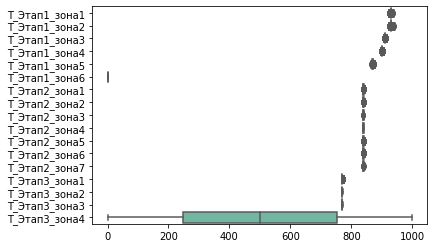

In [51]:
df_test = df[stages ['Обезуглероживание']][['T_Этап1_зона1', 'T_Этап1_зона2', 'T_Этап1_зона3', 'T_Этап1_зона4', 'T_Этап1_зона5',
 'T_Этап1_зона6', 'T_Этап2_зона1', 'T_Этап2_зона2', 'T_Этап2_зона3', 'T_Этап2_зона4', 'T_Этап2_зона5', 'T_Этап2_зона6',
 'T_Этап2_зона7', 'T_Этап3_зона1', 'T_Этап3_зона2', 'T_Этап3_зона3', 'T_Этап3_зона4']]
sns.boxplot(data = df_test, orient="h", palette="Set2")

In [52]:
df[stages ['Обезуглероживание']][['H2_Этап1', 'H2_Этап2_зона1', 'H2_Этап2_зона2', 'H2_Этап2_зона3', 'H2_Этап2_зона4',
 'H2_Этап2_зона5', 'H2_Этап3_зона1', 'H2_Этап3_зона2', 'H2_Этап3_зона3', 'H2_Этап4_зона1',]]

,H2_Этап1,H2_Этап2_зона1,H2_Этап2_зона2,H2_Этап2_зона3,H2_Этап2_зона4,H2_Этап2_зона5,H2_Этап3_зона1,H2_Этап3_зона2,H2_Этап3_зона3,H2_Этап4_зона1
Индекс,,,,,,,,,,
0,69.75,69.17,68.23,65.46,53.39,69.7,36.00,18.704960,0.102041,51.69
1,69.75,69.17,68.23,65.46,53.39,70.8,36.00,14.925400,0.102041,51.69
2,69.75,69.17,68.23,65.46,53.39,69.9,36.00,9.393013,0.102041,51.69
3,69.75,69.17,68.23,65.46,53.39,69.1,36.00,19.393900,0.102041,51.69
4,69.75,69.17,68.23,65.46,53.39,71.9,36.00,21.801160,0.102041,51.69
...,...,...,...,...,...,...,...,...,...,...
12786,69.50,69.00,68.08,65.77,57.77,71.2,35.42,18.086653,0.102041,49.92
12787,69.50,69.00,68.08,65.77,57.77,69.1,35.42,23.054686,0.102041,49.92
12788,69.50,69.00,68.08,65.77,57.77,70.0,35.42,8.085216,0.102041,49.92


<AxesSubplot:>

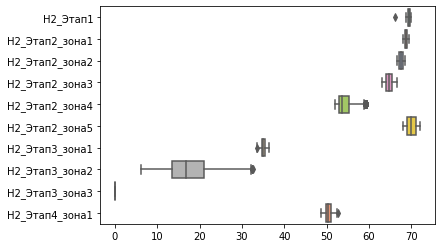

In [53]:
df_test = df[stages ['Обезуглероживание']][['H2_Этап1', 'H2_Этап2_зона1', 'H2_Этап2_зона2', 'H2_Этап2_зона3', 'H2_Этап2_зона4',
 'H2_Этап2_зона5', 'H2_Этап3_зона1', 'H2_Этап3_зона2', 'H2_Этап3_зона3', 'H2_Этап4_зона1',]]
sns.boxplot(data = df_test, orient="h", palette="Set2")

#### 6 - Химия итог:

In [54]:
df[stages ['Химия итог']].describe()
# выбросов не видно

,Углерод_начало,Толщина_средняя,Азот_конец,Азот_начало,Азот_среднее,Кислород_начало,ЗВО,Кислород_конец,Кислород_среднее,Углерод_конец,Углерод_среднее,Водород_начало,Водород_среднее
count,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000
mean,0.003309,24.541787,0.022509,0.022879,0.022694,0.078361,3.390978,0.081098,0.079730,0.003253,0.003281,2.255007,3.397232
std,0.000770,1.011405,0.001169,0.001520,0.000996,0.008251,0.313461,0.006075,0.006587,0.000674,0.000651,0.720063,1.407279
min,0.002200,23.000000,0.020000,0.019000,0.020000,0.063000,3.000000,0.067600,0.067400,0.002500,0.002600,1.000000,1.000000
25%,0.002700,24.000000,0.022000,0.022000,0.022000,0.075000,3.000000,0.078700,0.073950,0.002800,0.002800,1.600000,2.300000
50%,0.002900,24.000000,0.023000,0.023000,0.023000,0.078000,3.500000,0.082300,0.079700,0.003100,0.003000,2.300000,3.200000
75%,0.003900,25.000000,0.023000,0.024000,0.023500,0.085000,3.500000,0.086000,0.085500,0.003200,0.003650,2.900000,4.500000
max,0.004700,26.000000,0.025000,0.025000,0.024500,0.091000,4.000000,0.090200,0.089250,0.005300,0.005000,3.500000,6.700000


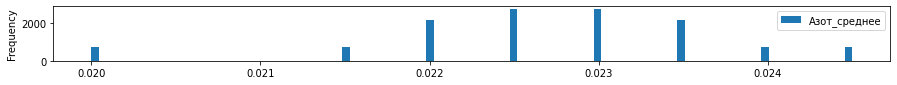

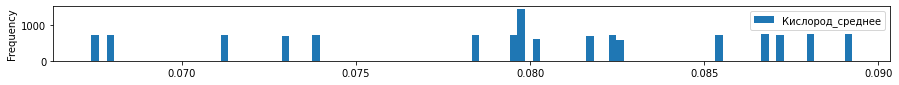

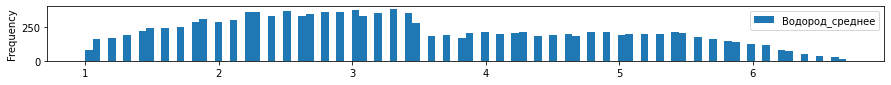

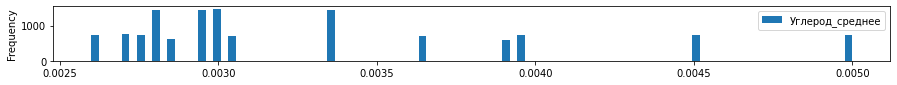

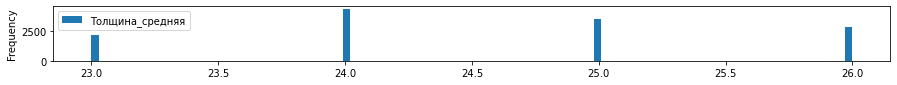

In [55]:
elements = ['Азот_среднее','Кислород_среднее','Водород_среднее', 'Углерод_среднее', 'Толщина_средняя']

for element in elements:
    df[element].plot.hist(bins=100,legend=True,figsize=(15, 1))
    plt.show()        


<AxesSubplot:>

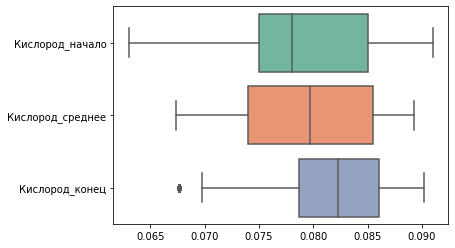

In [56]:
df_test = df[stages ['Химия итог']][['Кислород_начало','Кислород_среднее','Кислород_конец']]
sns.boxplot(data = df_test, orient="h", palette="Set2")

<AxesSubplot:>

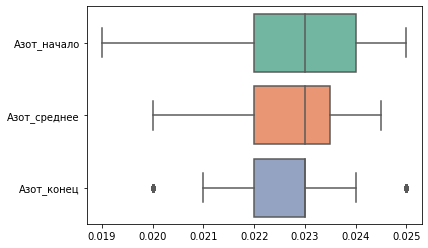

In [57]:
df_test = df[stages ['Химия итог']][['Азот_начало','Азот_среднее','Азот_конец']]
sns.boxplot(data = df_test, orient="h", palette="Set2")

<AxesSubplot:>

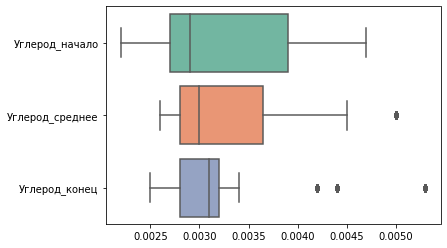

In [58]:
df_test = df[stages ['Химия итог']][['Углерод_начало','Углерод_среднее','Углерод_конец']]
sns.boxplot(data = df_test, orient="h", palette="Set2")

<AxesSubplot:>

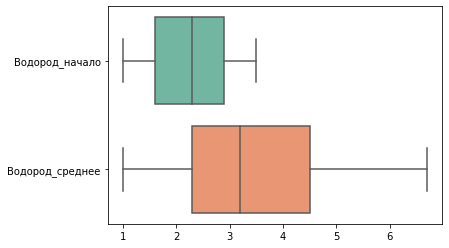

In [59]:
df_test = df[stages ['Химия итог']][['Водород_начало','Водород_среднее']]
sns.boxplot(data = df_test, orient="h", palette="Set2")

#### 7 - Магнитные свойства:

In [60]:
df[stages ['Магнитные свойства']].describe()

,Длина_МС,Средние_магнитные_потери,Коэффициент_свойств_стали,Толщина_МС,Удельные_потери
count,12791.000000,12791.000000,12791.000000,12791.000000,12791.000000
mean,3690.181378,1.217264,2.163240,0.286456,1.214428
std,2061.213914,0.220191,0.771621,0.008711,0.270874
min,100.000000,1.010000,1.000000,0.131000,0.488000
25%,1910.000000,1.060000,2.000000,0.287000,1.041000
50%,3690.000000,1.170000,2.000000,0.288000,1.103000
75%,5450.000000,1.220000,3.000000,0.289000,1.276000
max,7680.000000,1.750000,3.000000,0.356000,2.281000


<AxesSubplot:>

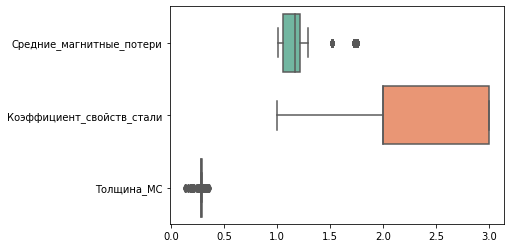

In [61]:
df_test = df[stages ['Магнитные свойства']][['Средние_магнитные_потери', 'Коэффициент_свойств_стали', 'Толщина_МС']]
sns.boxplot(data = df_test, orient="h", palette="Set2")

<a id='1200'></a>
### Анализ корелляций переменных

In [62]:
#Функция отрисовки матрицы корелляции
def correl(stage, font_scale, font_size = 14):
        # Plot
    dfc = pd.concat([df[stages [stage]], df['Удельные_потери']], axis=1)
    plt.figure(figsize=(len(stage),len(stage)), dpi= 80)
    corr_matrix = dfc.corr()
    corr_matrix = np.round(corr_matrix, 2)
    corr_matrix[np.abs(corr_matrix) < 0.3] = 0
    
    sns.set(font_scale = font_scale)
    sns.heatmap(corr_matrix, xticklabels=dfc.corr().columns, yticklabels=dfc.corr().columns, cmap='RdYlGn', center=0, annot=True)

    # Decorations
    plt.title(( 'Диаграмма корелляции ' + stage), fontsize=22)
    plt.xticks(fontsize=font_size)
    plt.yticks(fontsize=font_size)
    plt.show()

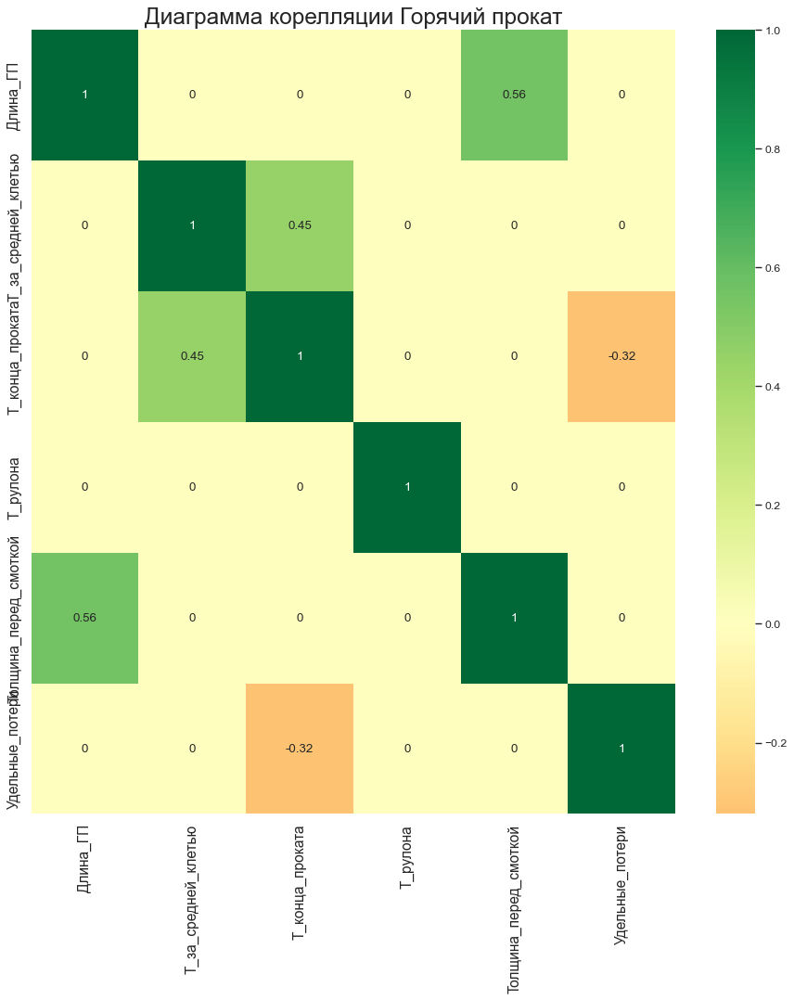

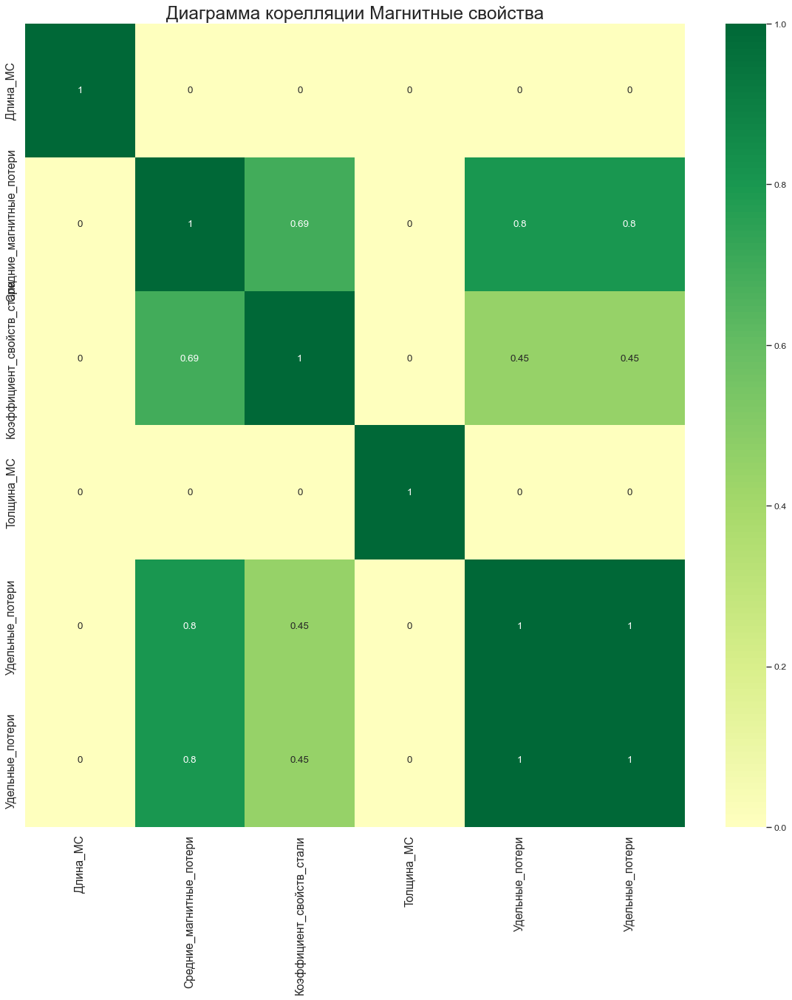

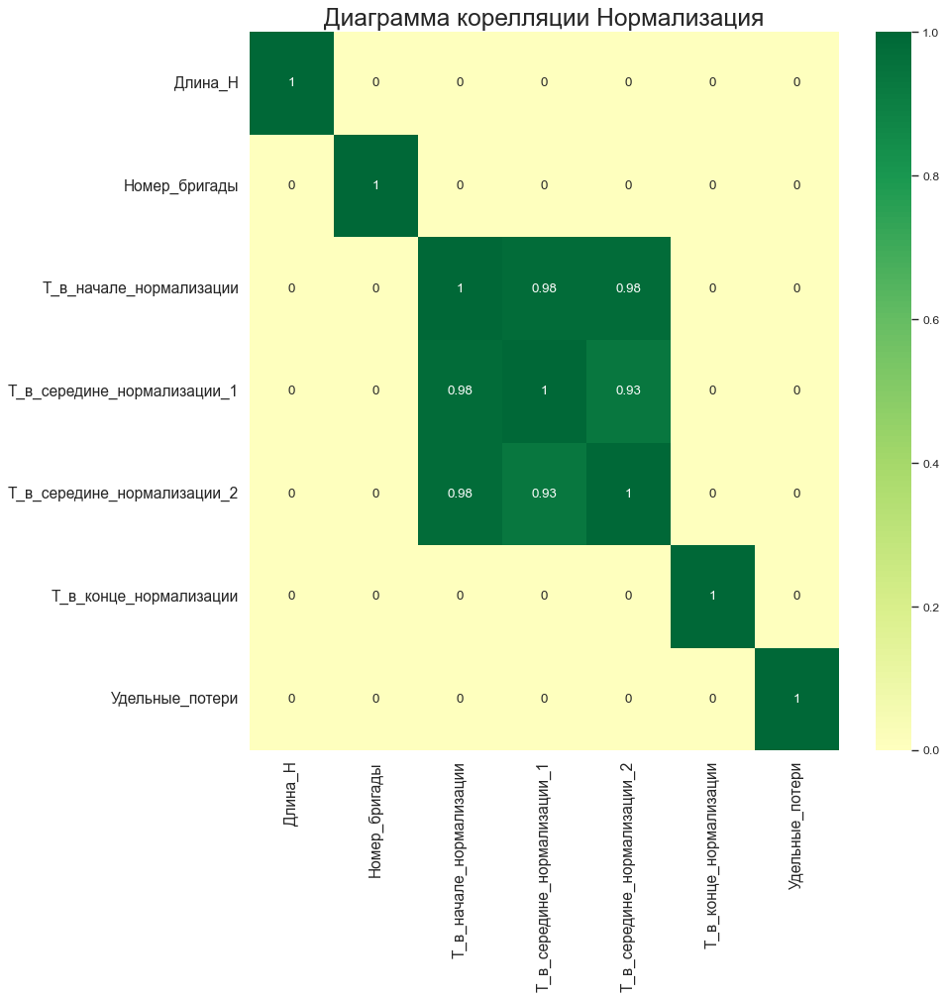

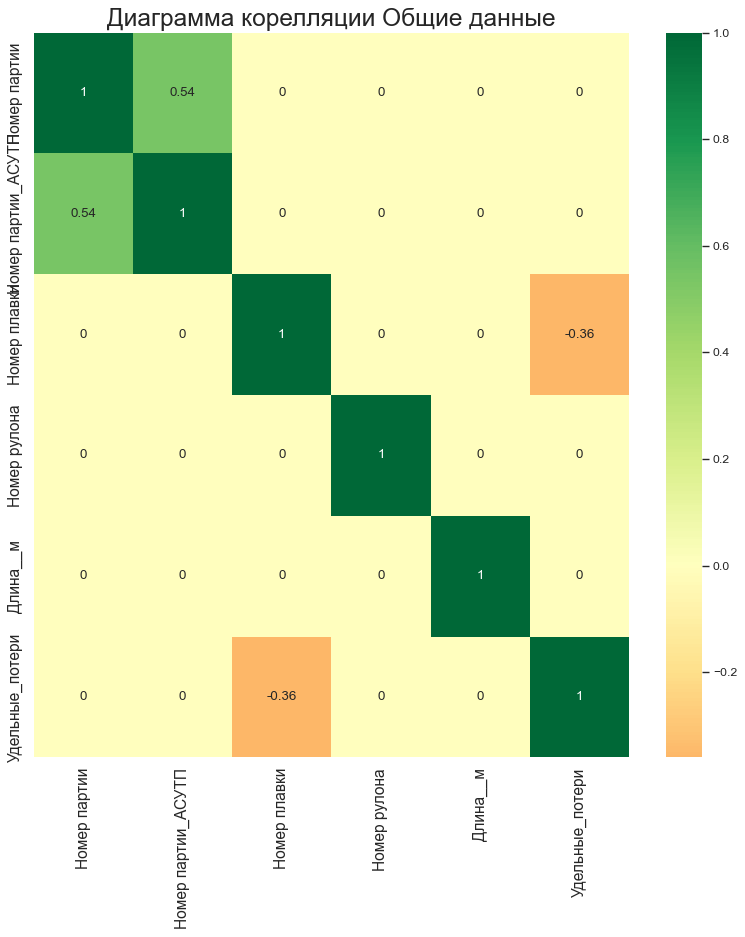

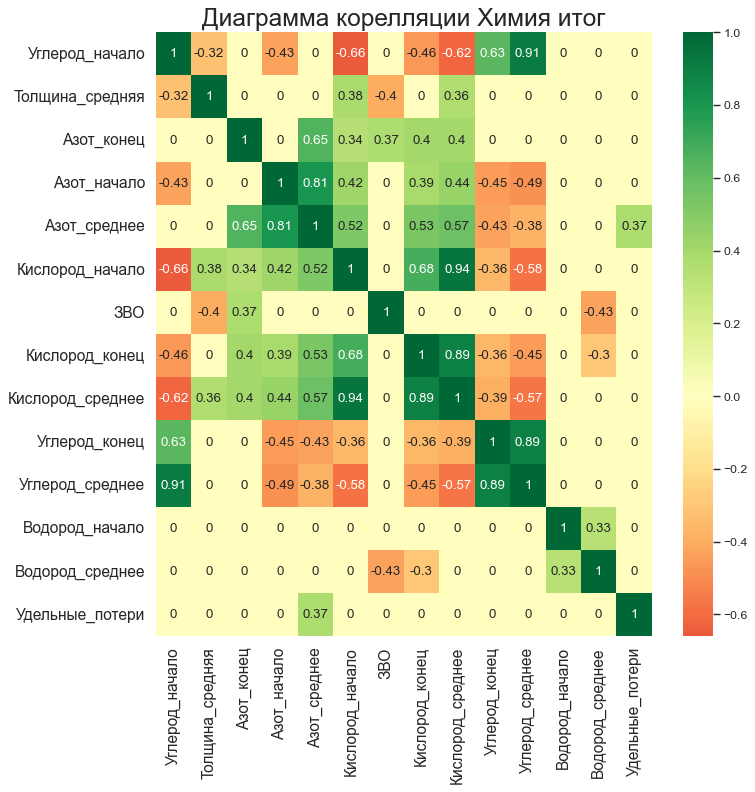

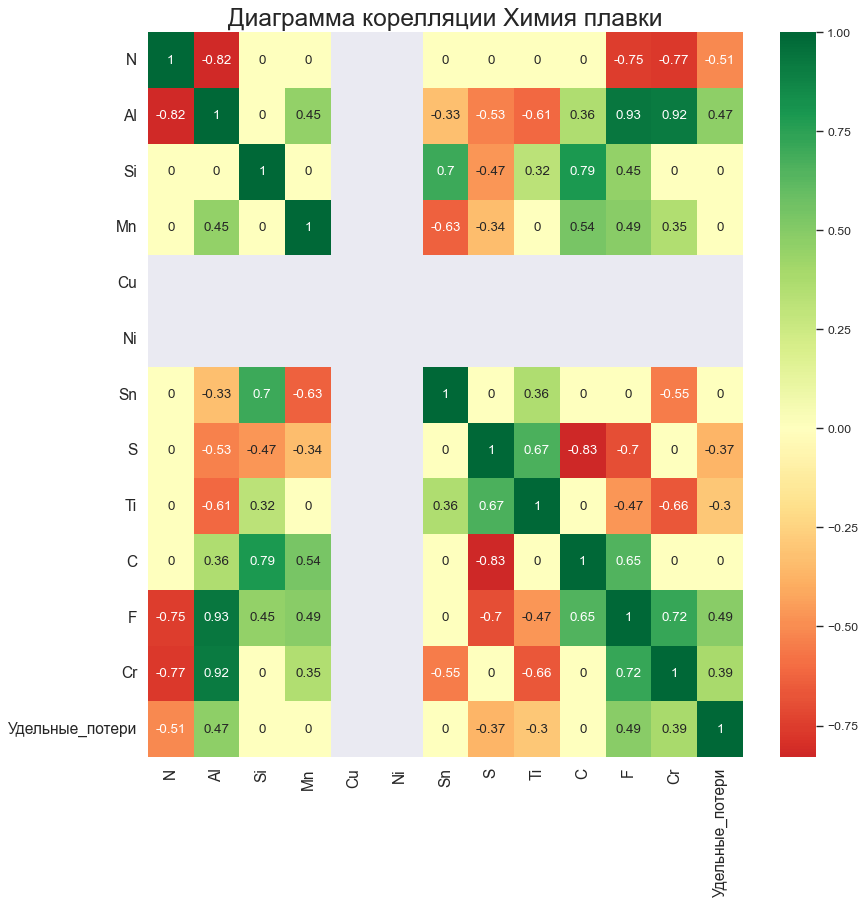

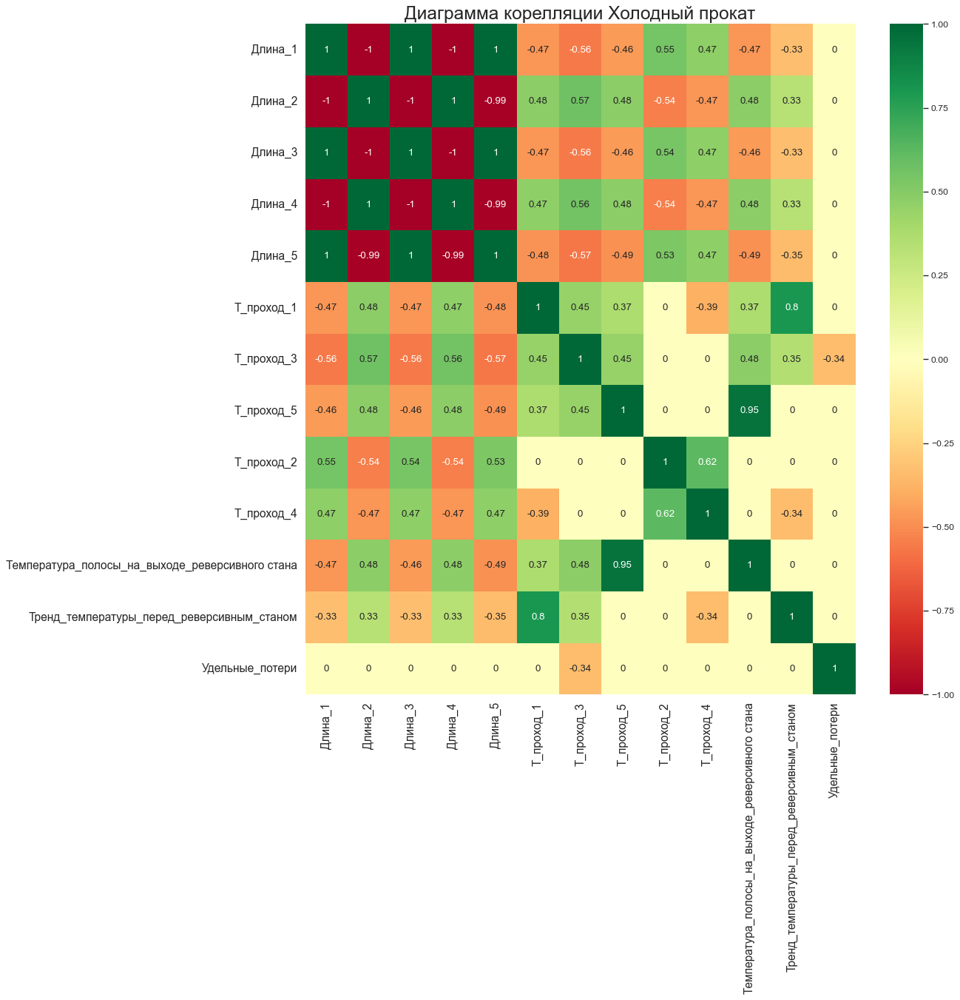

In [63]:
# Корелляции по этапам (считаем корелляцию значимой r > 0.7)
for pos in stages.keys():
    if pos != 'Обезуглероживание': correl(pos, 1) 

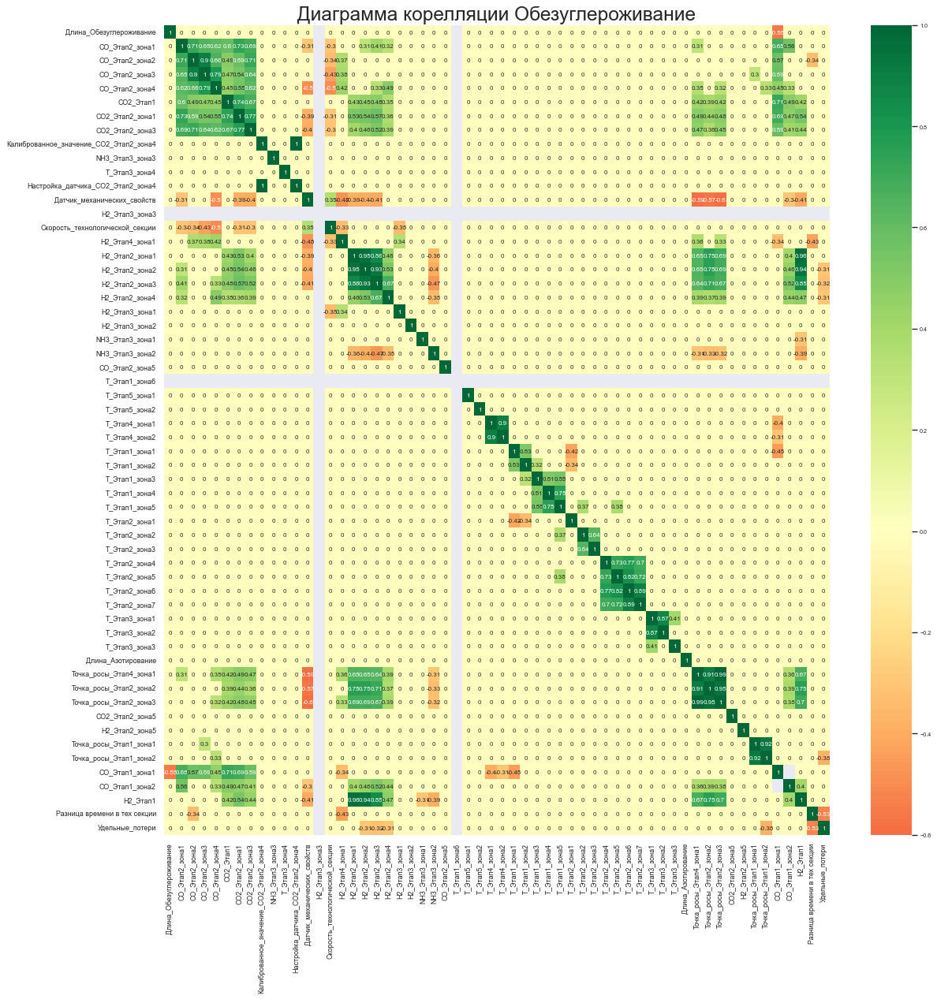

In [64]:
correl(stage ='Обезуглероживание', font_scale = 0.6, font_size = 8)

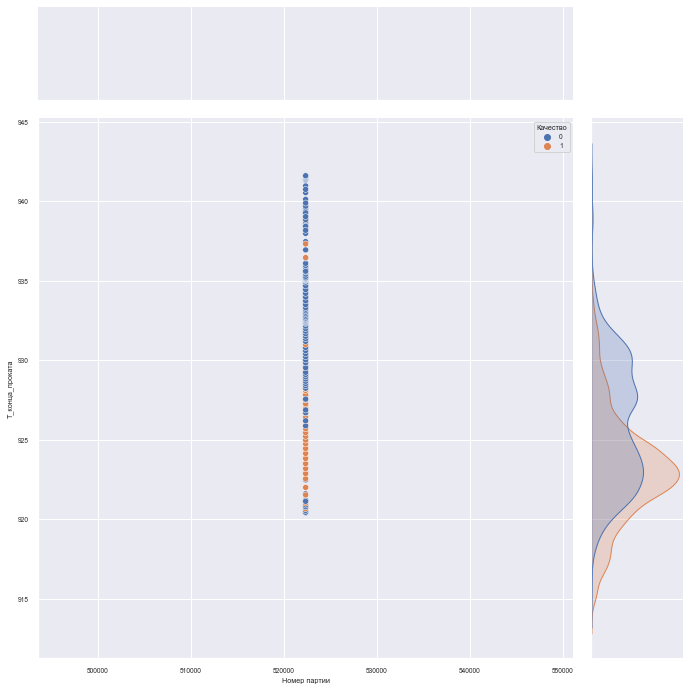

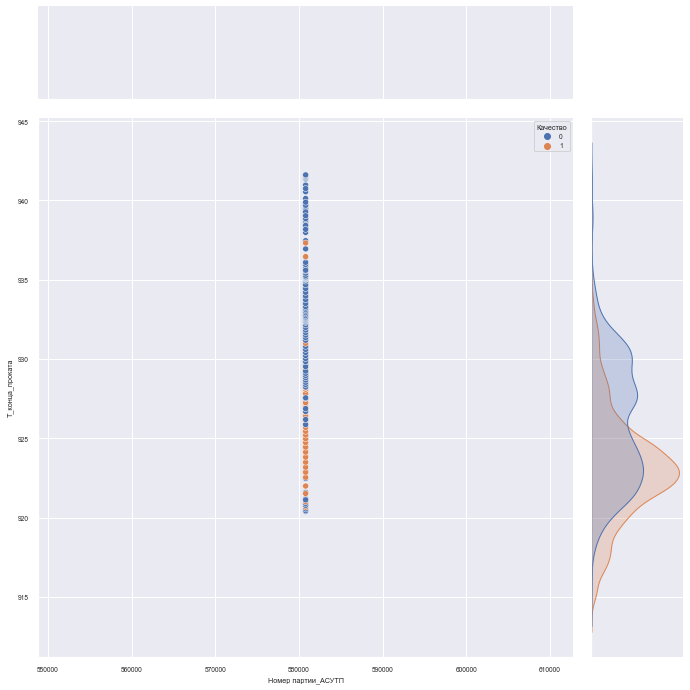

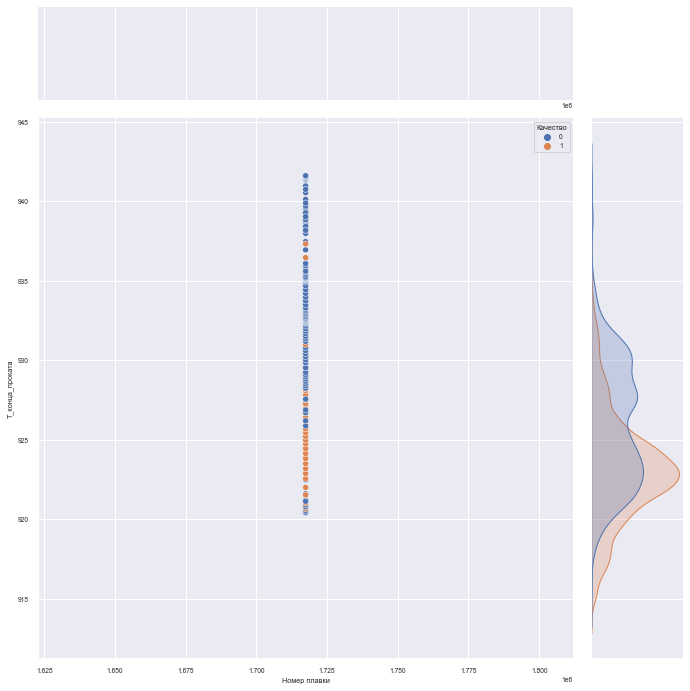

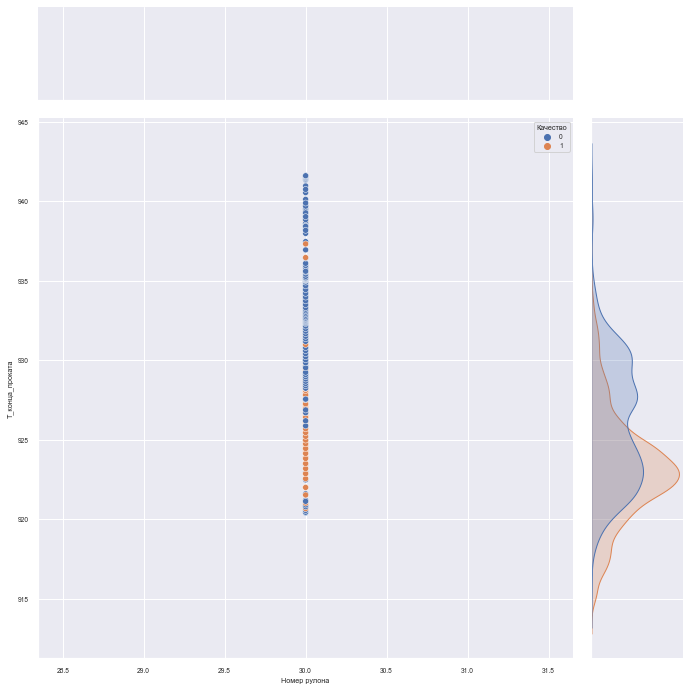

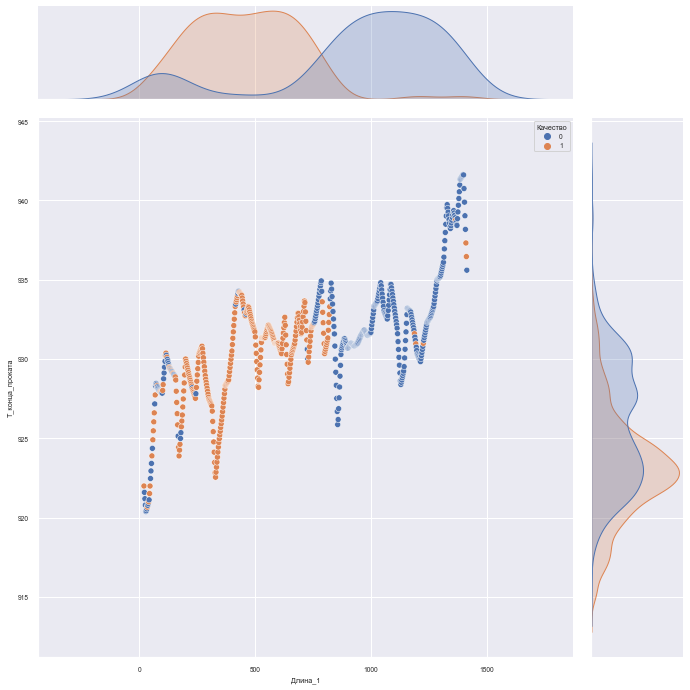

...

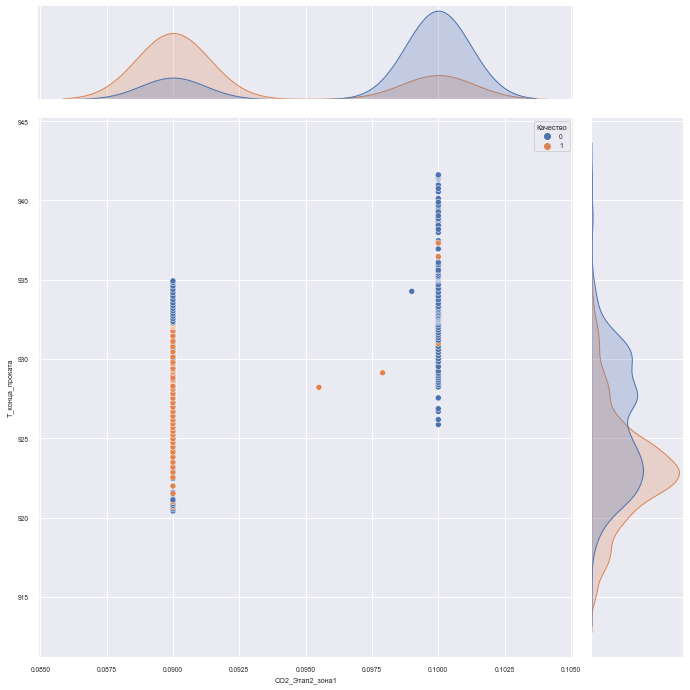

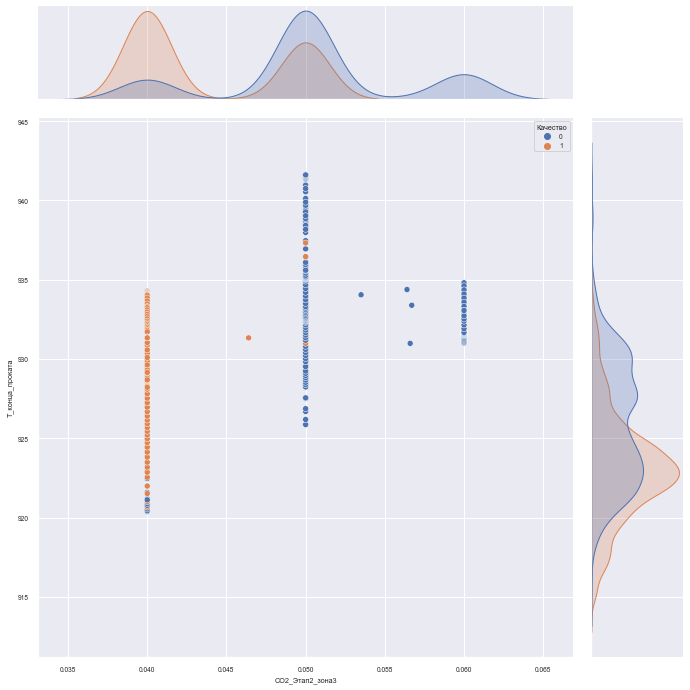

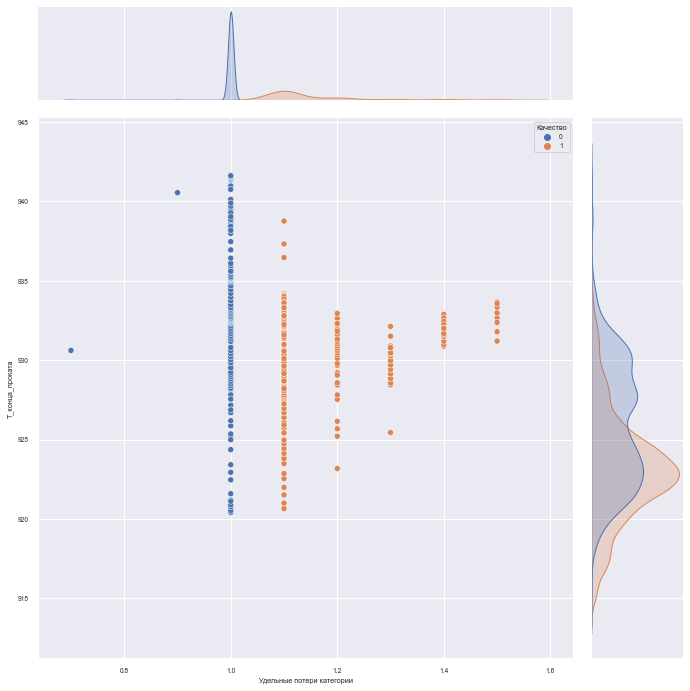

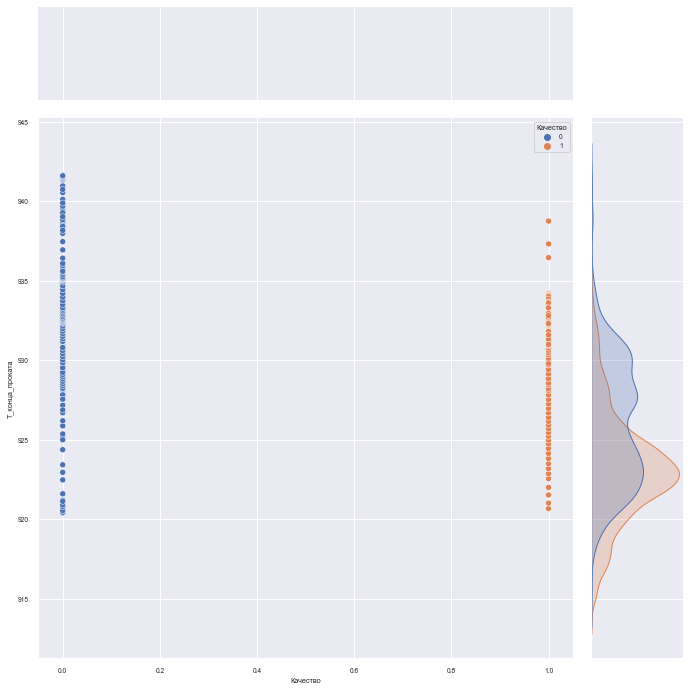

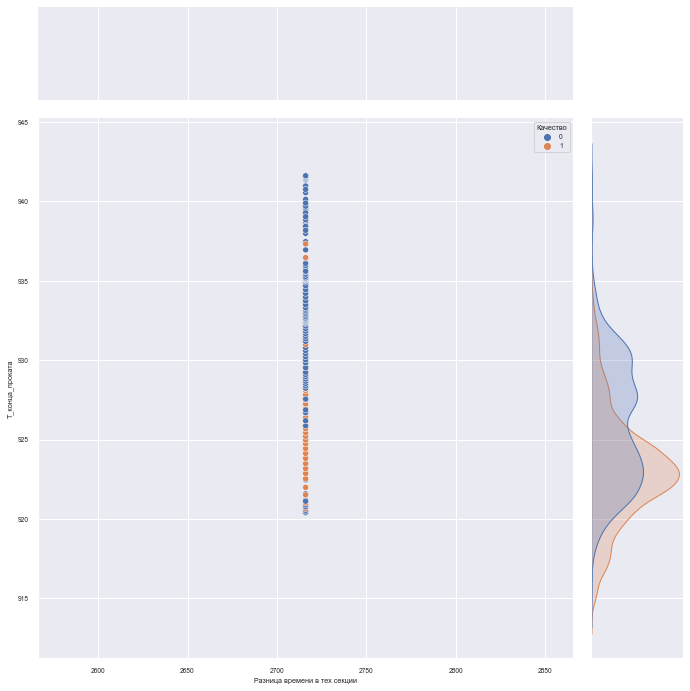

In [65]:
def joinplot(feature1, feature2, batch):
    grid = sns.jointplot(df[feature1][df['Номер партии'] == batch ], df[feature2],  hue=df['Качество'])
    grid.fig.set_figwidth(10)
    grid.fig.set_figheight(10)
    plt.show()

for pos in df.columns.values.tolist():
    try: joinplot(pos, 'T_конца_проката', 522370)
    except: pass

#### Категорирование фич:
<a id='300'></a>

In [66]:
# Уникальные значения столбца "шлакообразующая смесь" (slag - forming mixtures) - преобразовываем в категории
df = df.replace({'ШОС':{'Melubir 6736/LI':1, 'Melubir 6733/LI':2, 'Melubir 6739/LI':3, 'Melubir 6738/LI':4, 'Melubir 6731/LI':5}})

sfm_dummies = pd.get_dummies(df['ШОС'], prefix="ШОС", dummy_na=False)
df = pd.concat([df, sfm_dummies], axis=1)
# sfm_dummies

<a id='400'></a>

In [67]:
# Смотрим фичи, которые могут быть категориальными (< 10 уникальных значений):
df_unique_features = pd.DataFrame()
for pos in df.columns.values.tolist():
    new_row = {'feature': pos, 'Уникальных значений': (len(df[pos].unique()))} 
    df_unique_features = df_unique_features.append(new_row, ignore_index=True)
# df_unique_features.sort_values('Уникальных значений')[df_unique_features['Уникальных значений'] < 10].head(50)

In [68]:
# df_unique_features.sort_values('Уникальных значений')[df_unique_features['Уникальных значений'] < 10].head(50)

In [69]:
categorical_features = df_unique_features.sort_values('Уникальных значений')[df_unique_features['Уникальных значений'] < 10]['feature'].tolist()
categorical_features

['Ni',
 'Cu',
 'H2_Этап3_зона3',
 'T_Этап1_зона6',
 'ШОС_5',
 'S',
 'Mn',
 'ШОС_4',
 'Ti',
 'F',
 'Sn',
 'ШОС_3',
 'ШОС_2',
 'ШОС_1',
 'Качество',
 'Cr',
 'ЗВО',
 'Коэффициент_свойств_стали',
 'Номер_бригады',
 'Al',
 'Толщина_средняя',
 'C',
 'N',
 'Окончание непрерывного отжига',
 'Поступление_в_технологическую_секцию',
 'Выезд_из_технологической_секции',
 'Начало непрерывного отжига',
 'Номер плавки',
 'ШОС',
 'Si',
 'Разница времени в тех секции',
 'Азот_конец',
 'Азот_начало',
 'Азот_среднее']

In [70]:
df[categorical_features].astype('category')
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12791 entries, 0 to 12790
Data columns (total 127 columns):
 #    Column                                           Dtype              
---   ------                                           -----              
 0    Номер партии                                     int64              
 1    Номер партии_АСУТП                               int64              
 2    Номер плавки                                     int64              
 3    Номер рулона                                     int64              
 4    Длина_1                                          float64            
 5    Длина_2                                          float64            
 6    Длина_3                                          float64            
 7    Длина_4                                          float64            
 8    Длина_5                                          float64            
 9    Углерод_начало                                   float64   

<a id='1300'></a>
### Поиск ключевых признаков, влияющих на качество

In [71]:
# функция для отрисовки матрицы коррелляции
def corr_mtrx(stages, font_scale, font_size = 14):
        # Plot
    plt.figure(figsize=(20,20), dpi= 80)
    corr_matrix = stages.corr()
    corr_matrix = np.round(corr_matrix, 2)
    corr_matrix[np.abs(corr_matrix) < 0.3] = 0
    
    sns.set(font_scale = font_scale)
    sns.heatmap(corr_matrix, xticklabels=stages.columns, yticklabels=stages.columns, cmap='RdYlGn', center=0, annot=True)

    # Decorations
    plt.title(( 'Диаграмма корелляции '), fontsize=22)
    plt.xticks(fontsize=font_size)
    plt.yticks(fontsize=font_size)
    plt.show()

# функция для разметки матрицы корелляции цветом    
def color(val):
    if abs(val) > 0.7: color = 'grey'
    else: color = 'white'
    return 'background-color: %s' % color


In [72]:
# Словарь для управления параметрами
df_forest = [
# 'Горячий прокат':
    'Длина_ГП',
    'T_за_средней_клетью',
    'T_конца_проката',
#     'T_рулона',
#     'Толщина_перед_смоткой',
# 'Магнитные свойства':
#     'Длина_МС', # Исключаем из параметров !!! производная от тех процесса
#     'Средние_магнитные_потери', # Кореллирует с целевой переменной
#     'Коэффициент_свойств_стали', # Исключаем из параметров т.к. сводный параметр 
#     'Толщина_МС',  # Исключаем из параметров !!! производная от тех процесса
#     'Удельные_потери',
# 'Нормализация': 
#     'Длина_Н', # Кореллирует с 'Длина_ГП'
    'Номер_бригады',
    'T_в_начале_нормализации',
#     'T_в_середине_нормализации_1', # Кореллирует с 'T_в_начале_нормализации'
#     'T_в_середине_нормализации_2', # Кореллирует с 'T_в_начале_нормализации'
    'T_в_конце_нормализации',
# 'Обезуглероживание': 
#     'Длина_Обезуглероживание',
#     'Поступление_в_технологическую_секцию',   # Восстановленный  атрибут # Не используем, переводим в дельту времени
#     'Выезд_из_технологической_секции',   # Восстановленный  атрибут # Не используем, переводим в дельту времени
    'CO_Этап2_зона1',
#     'CO_Этап2_зона2', # Кореллирует с 'CO_Этап2_зона1'
#     'CO_Этап2_зона3', # Кореллирует с 'CO_Этап2_зона1'
#     'CO_Этап2_зона4', # Кореллирует с 'CO_Этап2_зона1'
#     'CO2_Этап1', # Кореллирует с 'CO_Этап2_зона1'
#     'CO2_Этап2_зона1', # Кореллирует с 'CO_Этап2_зона1'
#     'CO2_Этап2_зона3', # Кореллирует с 'CO_Этап2_зона1'
    'Калиброванное_значение_CO2_Этап2_зона4',
    'NH3_Этап3_зона3',
    'T_Этап3_зона4',
#     'Настройка_датчика_CO2_Этап2_зона4', # Кореллирует с 'Калиброванное_значение_CO2_Этап2_зона4'
    'Датчик_механических_свойств',
    'H2_Этап3_зона3',
    'Скорость_технологической_секции',
#     'H2_Этап4_зона1',
#     'H2_Этап2_зона1', # Кореллирует с'Точка_росы_Этап2_зона2'
#     'H2_Этап2_зона2', # Кореллирует с 'H2_Этап2_зона1'
#     'H2_Этап2_зона3', # Кореллирует с 'H2_Этап2_зона1'
#     'H2_Этап2_зона4',# Кореллирует с 'H2_Этап2_зона1'
#     'H2_Этап3_зона1',
#     'H2_Этап3_зона2',
#     'NH3_Этап3_зона1',
#     'NH3_Этап3_зона2',
    'CO_Этап2_зона5', 
#     'T_Этап1_зона6', # Значения отсутствуют
#     'Т_Этап5_зона1',
#     'Т_Этап5_зона2',
#     'Т_Этап4_зона1',
#     'Т_Этап4_зона2',
#     'T_Этап1_зона1',
#     'T_Этап1_зона2',
#     'T_Этап1_зона3',
#     'T_Этап1_зона4', # Кореллирует с 'T_Этап1_зона3'
#     'T_Этап1_зона5', # Кореллирует с 'T_Этап1_зона3'
#     'T_Этап2_зона1',
#     'T_Этап2_зона2',
#     'T_Этап2_зона3',
#     'T_Этап2_зона4', # некорректные данные, исключаем из анализа
#     'T_Этап2_зона5', # Кореллирует с 'T_Этап2_зона4'
#     'T_Этап2_зона6', # Кореллирует с 'T_Этап2_зона4'
#     'T_Этап2_зона7', # Кореллирует с 'T_Этап2_зона4'
#     'T_Этап3_зона1',
#     'T_Этап3_зона2',
#     'T_Этап3_зона3',
#     'Длина_Азотирование',
#     'Точка_росы_Этап4_зона1', # Восстановленный  атрибут
    'Точка_росы_Этап2_зона2', 
#     'Точка_росы_Этап2_зона3', # Кореллирует с 'Точка_росы_Этап2_зона2'
#     'Начало непрерывного отжига',  # Восстановленный  атрибут # Не используем, переводим в дельту времени
#     'Окончание непрерывного отжига',   # Восстановленный  атрибут # Не используем, переводим в дельту времени
#     'CO2_Этап2_зона5',
    'H2_Этап2_зона5',
    'Точка_росы_Этап1_зона1', # Восстановленный  атрибут
#     'Точка_росы_Этап1_зона2', # Восстановленный  атрибут # Кореллирует с 'Точка_росы_Этап1_зона1'
#     'CO_Этап1_зона1', # Кореллирует с 'CO2_Этап1', # Не используем - мало значений
#     'CO_Этап1_зона2',
#     'H2_Этап1', # Выбросы, исключаем из анализа
    'Разница времени в тех секции', # Вычисленный атрибут  # Корреллирует с ШОС 
# 'Общие данные': 
#     'Номер партии', # Не используем для прогнозирования - виртуальный параметр
#     'Номер партии_АСУТП', # Не используем для прогнозирования - виртуальный параметр
#     'Номер плавки', # Не используем для прогнозирования - виртуальный параметр
#     'Номер рулона', # Не используем для прогнозирования - виртуальный параметр
#     'Длина__м', # Кореллирует с 'Длина_Н'
# 'Химия итог': 
#     'Углерод_начало', # Кореллирует с 'Углерод_начало'
#     'Толщина_средняя',
#     'Азот_конец', # Кореллирует с 'Азот_среднее'
#     'Азот_начало', # Кореллирует с 'Азот_среднее'
#      'Азот_среднее', # !!! производная от тех процесса
#     'Кислород_начало',
#     'ЗВО',
#     'Кислород_конец',  # Кореллирует с 'Кислород_среднее'
#     'Кислород_среднее', # !!! производная от тех процесса
#     'Углерод_конец', # Кореллирует с 'Углерод_начало'
#     'Углерод_среднее',   # !!! производная от тех процесса
#     'Водород_начало',
    'Водород_среднее',
# 'Химия плавки': - все данные по химии плавки - снижают точность модели и значимость остальных атрибутов
    'N',
    'Al',
    'Si',
    'Mn',
    'Cu',
    'Ni',
    'Sn',
    'S',
    'ШОС',
    'Ti',
    'C',
    'F',
    'Cr',
# 'Холодный прокат': 
#     'Длина_1', # кореллирует с 'Длина_Н'
#     'Длина_2',  # кореллирует с 'Длина_1'
#     'Длина_3', # кореллирует с 'Длина_1'
#     'Длина_4', # кореллирует с 'Длина_1'
#     'Длина_5', # кореллирует с 'Длина_1'
#     'T_проход_1',
#     'T_проход_3',
#     'T_проход_5',
#     'T_проход_2',
#     'T_проход_4',
#     'Температура_полосы_на_выходе_реверсивного стана', # кореллирует с 'T_проход_5'
#     'Тренд_температуры_перед_реверсивным_станом', # кореллирует с 'T_проход_1'
#     'ШОС_1',   # Вычисленный атрибут (dummie) # Используем для классификации исходный столбец ШОС
#     'ШОС_2',   # Вычисленный атрибут (dummie) # Используем для классификации исходный столбец ШОС
#     'ШОС_3',   # Вычисленный атрибут (dummie) # Используем для классификации исходный столбец ШОС
#     'ШОС_4',   # Вычисленный атрибут (dummie) # Используем для классификации исходный столбец ШОС
#     'ШОС_5',   # Вычисленный атрибут (dummie) # Используем для классификации исходный столбец ШОС                      
]

# Отрисовываем матрицу коррелляции
# corr_mtrx(df[df_forest], font_scale = 0.6, font_size = 8).sort_values(
# df[pd.concat([df[df_forest], df['Удельные_потери']], axis=1)].corr()#.sort_values(by=df[df_forest].corr().columns.tolist())

# Еще раз проверяем корелляцию между отобранными признаками

(pd.concat([df[df_forest], df['Удельные_потери']], axis=1)).corr(method='pearson').sort_values('Удельные_потери').style.applymap(color)

,Длина_ГП,T_за_средней_клетью,T_конца_проката,Номер_бригады,T_в_начале_нормализации,T_в_конце_нормализации,CO_Этап2_зона1,Калиброванное_значение_CO2_Этап2_зона4,NH3_Этап3_зона3,T_Этап3_зона4,Датчик_механических_свойств,H2_Этап3_зона3,Скорость_технологической_секции,CO_Этап2_зона5,Точка_росы_Этап2_зона2,H2_Этап2_зона5,Точка_росы_Этап1_зона1,Разница времени в тех секции,Водород_среднее,N,Al,Si,Mn,Cu,Ni,Sn,S,ШОС,Ti,C,F,Cr,Удельные_потери
Разница времени в тех секции,-0.003367,-0.266462,0.193223,0.058222,-0.006272,-0.003475,-0.154471,0.002025,0.003644,0.002258,-0.049094,nan,-0.013680,-0.010216,0.138500,-0.011778,0.088445,1.000000,0.063841,0.506947,-0.395340,-0.245754,0.512274,nan,nan,-0.531589,0.537385,0.704290,0.485786,-0.156439,-0.424258,-0.307115,-0.529691
N,-0.000960,0.103235,0.040388,0.056450,0.019374,-0.036342,0.228394,0.004878,0.003680,-0.004256,-0.372842,nan,0.000885,-0.017288,0.543904,-0.003151,-0.098101,0.506947,-0.199605,1.000000,-0.822920,-0.185201,-0.010479,nan,nan,0.016646,0.169591,-0.168739,0.209769,-0.062747,-0.751247,-0.773653,-0.507574
S,-0.002835,-0.014957,0.145336,-0.006308,-0.034972,-0.024999,-0.245628,0.003180,0.008264,-0.005175,-0.224158,nan,-0.047081,0.002313,0.242728,-0.004282,0.088250,0.537385,0.467562,0.169591,-0.534872,-0.471226,-0.342284,nan,nan,-0.180724,1.000000,0.342858,0.669305,-0.826793,-0.702321,-0.284741,-0.367168
T_конца_проката,0.203047,0.449105,1.000000,-0.192536,-0.274793,-0.023037,0.042773,0.001109,0.005221,0.019901,-0.110435,nan,-0.350212,0.008205,-0.030817,0.000588,0.427916,0.193223,0.073163,0.040388,-0.007965,-0.180465,0.109813,nan,nan,-0.223249,0.145336,0.218628,0.015273,-0.127330,-0.071976,0.058449,-0.321470
Ti,0.007494,0.134954,0.015273,0.147236,0.161036,0.075483,-0.208897,0.001141,0.000183,-0.009357,0.186778,nan,0.019355,-0.003853,-0.041330,0.002958,0.038918,0.485786,0.692094,0.209769,-0.606920,0.317152,-0.229092,nan,nan,0.363906,0.669305,0.058554,1.000000,-0.189315,-0.470067,-0.656178,-0.300567
Точка_росы_Этап1_зона1,0.016493,0.122860,0.427916,-0.408666,-0.006050,-0.020534,0.146261,0.001204,0.018110,0.016399,-0.057424,nan,-0.253979,0.007342,-0.188937,0.005825,1.000000,0.088445,0.075941,-0.098101,0.081679,-0.048326,0.082530,nan,nan,-0.121936,0.088250,0.170994,0.038918,-0.053106,0.047961,0.103900,-0.282508
Точка_росы_Этап2_зона2,0.014678,0.107653,-0.030817,-0.241473,-0.147908,-0.070074,0.189129,0.004685,0.006095,-0.012913,-0.571072,nan,-0.081667,-0.007175,1.000000,-0.000090,-0.188937,0.138500,-0.262329,0.543904,-0.501506,-0.453987,-0.274208,nan,nan,-0.073181,0.242728,-0.171126,-0.041330,-0.391277,-0.595910,-0.330770,-0.253378
ШОС,-0.007280,-0.466655,0.218628,-0.038020,-0.100676,-0.016368,-0.284158,-0.001161,0.002718,0.009596,0.093277,nan,-0.031892,0.001834,-0.171126,-0.014125,0.170994,0.704290,-0.048045,-0.168739,0.323127,-0.372118,0.706216,nan,nan,-0.857068,0.342858,1.000000,0.058554,-0.154053,0.153314,0.448149,-0.191461
CO_Этап2_зона1,-0.043673,0.004662,0.042773,-0.311654,-0.209185,-0.042382,1.000000,0.006682,0.006284,0.006158,-0.309498,nan,-0.300497,-0.019461,0.189129,-0.004965,0.146261,-0.154471,-0.219498,0.228394,-0.105971,0.013747,-0.067269,nan,nan,0.123832,-0.245628,-0.284158,-0.208897,0.129241,-0.063730,-0.133267,-0.145360
Mn,-0.003189,-0.413487,0.109813,0.022157,-0.023229,0.017573,-0.067269,-0.002581,-0.003839,0.011226,0.261174,nan,0.016115,-0.005944,-0.274208,-0.010923,0.082530,0.512274,-0.348595,-0.010479,0.452183,0.087985,1.000000,nan,nan,-0.629538,-0.342284,0.706216,-0.229092,0.542566,0.487361,0.349132,-0.078310


In [73]:
df[df_forest].columns.tolist()

['Длина_ГП',
 'T_за_средней_клетью',
 'T_конца_проката',
 'Номер_бригады',
 'T_в_начале_нормализации',
 'T_в_конце_нормализации',
 'CO_Этап2_зона1',
 'Калиброванное_значение_CO2_Этап2_зона4',
 'NH3_Этап3_зона3',
 'T_Этап3_зона4',
 'Датчик_механических_свойств',
 'H2_Этап3_зона3',
 'Скорость_технологической_секции',
 'CO_Этап2_зона5',
 'Точка_росы_Этап2_зона2',
 'H2_Этап2_зона5',
 'Точка_росы_Этап1_зона1',
 'Разница времени в тех секции',
 'Водород_среднее',
 'N',
 'Al',
 'Si',
 'Mn',
 'Cu',
 'Ni',
 'Sn',
 'S',
 'ШОС',
 'Ti',
 'C',
 'F',
 'Cr']

<a id='1400'></a>
#### Влияние показателей на целевую переменную:

In [74]:
clf = RandomForestClassifier(random_state = 43)
clf.fit(df[df_forest], df['Качество'])

feature_importances=pd.DataFrame({'features':df[df_forest].columns,'Gini-Importance':clf.feature_importances_})
features = feature_importances.sort_values('Gini-Importance',ascending=False)
features = pd.merge(features, df_index, left_on='features', right_on='Название параметра',)
features [['Этап обработки','Название параметра', 'Gini-Importance', 'Описание']]

,Этап обработки,Название параметра,Gini-Importance,Описание
0,Обезуглероживание,Точка_росы_Этап2_зона2,0.120390,"Замеры с различных датчиков на этапе ""обезуглероживание"""
1,Горячий прокат,T_конца_проката,0.118838,Замеры температур
2,Горячий прокат,Длина_ГП,0.107641,Фактическая длина на этапе горячей прокатки
3,Горячий прокат,T_за_средней_клетью,0.086887,Замеры температур
4,Обезуглероживание,CO_Этап2_зона1,0.071149,"Замеры с различных датчиков на этапе ""обезуглероживание"""
5,Обезуглероживание,Точка_росы_Этап1_зона1,0.070751,"Замеры с различных датчиков на этапе ""обезуглероживание"""
6,Нормализация,T_в_начале_нормализации,0.039744,Замеры температур
7,Химия итог,Водород_среднее,0.038227,Итоговый химический анализ рулона
8,Химия плавки,Cr,0.034429,Химический анализ рулона до обработки
9,Химия плавки,N,0.032651,Химический анализ рулона до обработки


In [75]:
# Из анализа удалил параметры этапа 'Химия итог', 'Магнитные свойства' как производные техпроцесса
# 'Азот_среднее',  
# 'Кислород_среднее', 
# 'Углерод_среднее', 
# 'Длина_МС', 
# 'Толщина_МС',  

# с параметрами точность модели выше.

<a id='1500'></a>
#### Предсказание целевой переменной

In [76]:
X = df[df_forest]  
y = df['Качество']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state = 43, stratify=y)

# ss = StandardScaler()
# X_train_scaled = ss.fit_transform(X_train)
# X_test_scaled = ss.transform(X_test)
# y_train = np.array(y_train)
# y_test = np.array(y_test)

rfc = RandomForestClassifier(n_estimators=300, random_state=42)
# rfc.fit(X_train_scaled, y_train)
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

print(confusion_matrix(y_pred, y_test ))
print(classification_report(y_pred, y_test))
print(f' Итоговая точность модели: {accuracy_score(y_pred, y_test)}')

[[2391   85]
 [ 105 2536]]
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      2476
           1       0.97      0.96      0.96      2641

    accuracy                           0.96      5117
   macro avg       0.96      0.96      0.96      5117
weighted avg       0.96      0.96      0.96      5117

 Итоговая точность модели: 0.9628688684776237
